# Artificial Neural Networks in Fixed Income Markets for Yield Curve Forecasting

In this project we replicate the results of the above paper to understand the potential of neural networks to forecast yields. We try to understand the reach and limitations of neural networks.

The authors propose mainly two types of models - Single Task Learning (STL) and Multi Task Learning (MTL) to forecast individual yields for per time step and forecasting them together 

### Notes:

The initial data was extracted using Bloomberg through the additional information provided by Dr. Manuel Nunesa.

After extracting the data, we calculate other features eg: the moving averages in excel and obtain the 159 original features.

This was then used to develop the 795 addidional features according to the paper.

## Index

* [1. Getting Started](#1)
    * [1.1. Loading necessary libraries](#1.1)    
    * [1.2. Loading the data](#1.2)  
    * [1.3. Nature of the Dataset](#1.3)
    * [1.4. Handling missing data](#1.4)
    * [1.5. Generating additional features](#1.5)
    
* [2. Developing the models](#2)
    
    * [2.1. Lasso feature selection](#2.1)    
    * [2.2. Linear Regression Model](#2.2)
    * [2.3. Relevant features models: Non-normalised and normalised](#2.3)
        * [2.3.1. Relevant Feature non-normalised model](#2.3.1)
        * [2.3.2. Relevant Feature normalised model](#2.3.2)
    * [2.4. Target Only model](#2.4)
    * [2.5. Relevant Feature + Linear Regression data model](#2.5)
    * [2.6. Target Only + Linear Regression data model](#2.6)
    * [2.7. Multi-Task Learning](#2.7)
    
    
    
    
* [3. Training the models](#3)
    * [3.1. Training the STL model](#3.1)    
    * [3.2. Training non-normalised model](#3.2)
    * [3.3. Training the MTL model](#3.3)
    
* [4. Results](#4)        
    * [4.1. STL: MSE values per yield per forecasting horizon](#4.1)
    * [4.2. Normalized Vs non-normalized metrics](#4.2)
    * [4.3. Forecasting results for 10Y](#4.3) 
    * [4.4. STL Vs  MTL: 0 days and 20 days](#4.4) 

<a id='1'></a>
## 1. Getting Started
---------------------------------

<a id='1.1'></a>
### 1.1. Loading necessary packages

In [1]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, random

from sklearn.preprocessing import StandardScaler,Normalizer
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.metrics import RootMeanSquaredError

<a id='1.2'></a>
### 1.2. Loading the data

In [2]:
file_paths="/kaggle/input/yield-curve-kirk/data_ann (2).csv"
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)

<a id='1.3'></a>
### 1.3. Nature of the dataset
The processed data is the historical values of the 159 features and from 1998 to 2017

<a id='1.4'></a>
### 1.4. Handling missing data

In [3]:
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

<a id='1.5'></a>
### 1.5. Generating additional features
We generate the additional 795 features by implementing the 5 timesteps for each feature, hence 5 x 159 = 795 additional features

In [4]:
def feature_generation_for_models(df,feature_of_Interest):
    
    '''
    
    
    Input: The dataframe and the name of the feature that we are interested in

    Output: returns a dataframe with the relevant features


    '''
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    
    #just a precaution if there is any missing data
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    data = df

    
    # target column names 
    target_columns = data.columns[-5:]

    
    # Generate features for original features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

   
    return features_with_lags

<a id='2'></a>
# 2. Developing the models
---------------------------------

 #### We develop six different models 
 
 #### 1. Linear Regression 
 
 #### 2. Neural Network relevant Featature :
 
             MLP model using feature selection to determine the relevant features
 
 #### 3. Neural Network Target Only :
 
             MLP model with target feature only
 
 #### 4. Neural Net relevant Feature + Linear Regression : 
 
             MLP using feature selection to obtain relevant features and generate synthetic additional feature using linear regression
 
 #### 5. Neural Net Target Only + Linear Regression :
 
             MLP with target feature and generate synthetic additional feature using linear regression
              
 #### 6. Multi Task Learning (MLt )Neural Net relevant features :
 
             MLP with RELEVANT features for more than 1 target. Fix the horizon and forecast the yields

<a id='2.1'></a>
### 2.1. Lasso feature selection

In order to select features we use lasso with an regularization of 4  

In [5]:
def lasso_feature_selection(X_train,y_train):
        
    '''
    
    Input: Training and testing features to figure out the relevant features

    Output: Returns a list of column names of relevant features

    '''
    
    lasso_model = Lasso(alpha=0.001) # we choose an alpha of 4 here
    lasso_model.fit(X_train, y_train)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    return selected_columns

<a id='2.2'></a>
### 2.2. Linear Regression Model

The linear regression model is widely used forecasting mainly due to its simplicity. Here we make predictions for the targets that we feed in which is a combination of yields and forecasting horizons and also obtain the various loss metrics

In [6]:
def linear_reg_model(df,feature_of_Interest):
    
    
    '''
    
    
    Input: the feature that we are interested in

    Output: returns a dictionary of metrics of the model
   
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)


    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]
    
    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    
    # normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  

    
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)
    predictions = model.predict(X_test_forecast)
    
    
    # Computing the mse error metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    
    
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'predictions':predictions,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

<a id='2.3'></a>
### 2.3. Relevant features models: Non-normalised and normalised

<a id='2.3.1'></a>
#### 2.3.1. Relevant Feature non-normalised model

We do not normalize the data before feeding it into the NN just to compare it with the losses of the normalized model

In [7]:
def NN_RelFeat_non_normalized(df,feature_of_Interest):

    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    #Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)
    X_train_normalized=X_train[list(selected_columns)]
    X_test_normalized=X_test[list(selected_columns)]

    
    # Select 50 random points from the test set 
    random.seed(42) 
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    
    
    # Loss metrics and values
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

<a id='2.3.2'></a>
#### 2.3.2. Relevant Feature normalised model

We determine the relevant features using lasso and feed it into the MLP with 10 fully connected layers

In [8]:
def NN_RelFeat(df, feature_of_Interest):
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''

    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]
    

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    # Lasso feature selection
    selected_columns = lasso_feature_selection(X_train,y_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    #normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    
    
    # Select 50 random points from the test set 
    random.seed(42)
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    
    
    #loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

<a id='2.4'></a>
### 2.4. Target Only model
Here, we feed only the target data into the neural network

In [9]:
def NN_TgtOnly(df,feature_of_Interest):

    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)
    
    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    
    
    # Normalizing the data
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]

    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    
    
    #Loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))

    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


<a id='2.5'></a>
### 2.5. Relevant Feature + Linear Regression data model
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the relevant features

In [10]:
#NN RelFeat+LRdata
def RealFeat_LRdata(df,feature_of_Interest):
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    
    # Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    #Normalizing the data
    scaler = StandardScaler()
    X_train_normalized1 = scaler.fit_transform(X_train)
    X_test_normalized1 = scaler.transform(X_test)
    
    
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)
    
    
    # Generating synthetic data for train and test sets
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    
    # Imputing the synthetic data
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]
    

    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    # Make predictions
    predictions = model.predict(X_test_forecast)
    
    
    # Loss metrics
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

<a id='2.6'></a>
### 2.6. Target Only + Linear Regression data model
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the the target feature only. The additional feature using the LR model acts as synthetic feature for the MLP

In [11]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(df,feature_of_Interest):
    
    
    '''
    
    
    Input: the feature that we are interested in. 
    
    Output: returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    # We obtain the complete dataset including the 795 generated features from the 159 original features
    features_with_lags=feature_generation_for_models(df,feature_of_Interest)

    
    target_columns=[feature_of_Interest]

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]
    y = features_with_lags[target_columns]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
   

    # Lasso feature selection
    selected_columns=lasso_feature_selection(X_train,y_train)    
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    
    # Lasso feature selection
    scaler = StandardScaler()
    X_train_normalized1 = scaler.fit_transform(X_train)
    X_test_normalized1 = scaler.transform(X_test)
    
    
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)
    
    
    # generate synthetic data
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    
    # Imputing synthetic data
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    
    # Imputing the target only data aswell
    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    
    # Normalizing the data
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    
    
    # Select 50 random points from the test set 
    random.seed(42)  
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  

    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    # Make Predictions
    predictions = model.predict(X_test_forecast)
    
    
    
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
        
    return a

<a id='2.7'></a>
### 2.7. Multi-Task Learning
Here we generate a synthetic additional feature using linear regression and feed it to the MLP with the the target feature only. The additional feature using the LR model acts as synthetic feature for the MLP

In [12]:
def mlt_RelFeat(df,feature_of_Interest):
    
    '''
    
    
    Input: The feature that we are interested in. 
    
    Output: Returns a dictionary of metrics of the model
    
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    
    '''
    
    
    features_with_lags=feature_generation_for_models(df,feature_of_Interest[0])
    
    
    target_columns=feature_of_Interest

    
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    selected_columns=lasso_feature_selection(X_train,y_train)
    
    
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    
    
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    

    # Select 50 random points from the test set 
    random.seed(42) 
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]
    
    
    # MLP architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    
    
    
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    
    mse_values=(predictions - y_test_forecast)**2
    
    
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a

<a id='3'></a>
### 3. Training the models
----------


<a id='3.1'></a>
#### 3.1. Training the STL model

In [13]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        target_=j+str(i)
        a=linear_reg_model(df,target_)
        b=NN_RelFeat(df,target_)
        c=NN_TgtOnly(df,target_)
        d=RealFeat_LRdata(df,target_)
        e=NN_TgtOnly_LRdata(df,target_)
        if (i==1 and target_=='GECU10YR_lag_1'):
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.3493 - mae: 1.4862 - mse: 3.3493 - root_mean_squared_error: 1.8301 - val_loss: 0.7428 - val_mae: 0.6656 - val_mse: 0.7428 - val_root_mean_squared_error: 0.8619

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4858 - mae: 0.5195 - mse: 0.4858 - root_mean_squared_error: 0.6970 - val_loss: 0.2473 - val_mae: 0.3801 - val_mse: 0.2473 - val_root_mean_squared_error: 0.4972

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1676 - mae: 0.2942 - mse: 0.1676 - root_mean_squared_error: 0.4094 - val_loss: 0.1159 - val_mae: 0.2407 - val_mse: 0.1159 - val_root_mean_squared_error: 0.3405

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0856 - mae: 0.2196 - mse: 0.0856 - root_mean_squared_error: 0.2925 - val_loss: 0.0710 - val_mae: 0.1962 - val_mse: 0.0710 - val_root_mean_squared_error: 0.2665

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.958e+00, tolerance: 3.962e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 1.8011 - mae: 1.0569 - mse: 1.8011 - root_mean_squared_error: 1.3420 - val_loss: 0.4909 - val_mae: 0.5742 - val_mse: 0.4909 - val_root_mean_squared_error: 0.7006

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1641 - mae: 0.3086 - mse: 0.1641 - root_mean_squared_error: 0.4051 - val_loss: 0.1089 - val_mae: 0.2540 - val_mse: 0.1089 - val_root_mean_squared_error: 0.3300

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0630 - mae: 0.1900 - mse: 0.0630 - root_mean_squared_error: 0.2511 - val_loss: 0.0609 - val_mae: 0.1925 - val_mse: 0.0609 - val_root_mean_squared_error: 0.2467

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0441 - mae: 0.1567 - mse: 0.0441 - root_mean_squared_error: 0.2099 - val_loss: 0.0386 - val_mae: 0.1472 - val_mse: 0.0386 - val_root_mean_squared_error: 0.1965

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.400e+00, tolerance: 4.018e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 4.0533 - mae: 1.6812 - mse: 4.0533 - root_mean_squared_error: 2.0133 - val_loss: 1.1102 - val_mae: 0.9095 - val_mse: 1.1102 - val_root_mean_squared_error: 1.0536

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 0.4764 - mae: 0.5306 - mse: 0.4764 - root_mean_squared_error: 0.6902 - val_loss: 0.2005 - val_mae: 0.3332 - val_mse: 0.2005 - val_root_mean_squared_error: 0.4477

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1396 - mae: 0.2668 - mse: 0.1396 - root_mean_squared_error: 0.3736 - val_loss: 0.0829 - val_mae: 0.2296 - val_mse: 0.0829 - val_root_mean_squared_error: 0.2879

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.0657 - mae: 0.1947 - mse: 0.0657 - root_mean_squared_error: 0.2563 - val_loss: 0.0497 - val_mae: 0.1793 - val_mse: 0.0497 - val_root_mean_squared_error: 0.2229

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.1236 - mae: 1.4749 - mse: 3.1236 - root_mean_squared_error: 1.7674 - val_loss: 0.4535 - val_mae: 0.5568 - val_mse: 0.4535 - val_root_mean_squared_error: 0.6734

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4060 - mae: 0.5000 - mse: 0.4060 - root_mean_squared_error: 0.6372 - val_loss: 0.2307 - val_mae: 0.3827 - val_mse: 0.2307 - val_root_mean_squared_error: 0.4803

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2014 - mae: 0.3388 - mse: 0.2014 - root_mean_squared_error: 0.4488 - val_loss: 0.1474 - val_mae: 0.3247 - val_mse: 0.1474 - val_root_mean_squared_error: 0.3840

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1385 - mae: 0.2751 - mse: 0.1385 - root_mean_squared_error: 0.3722 - val_loss: 0.0999 - val_mae: 0.2728 - val_mse: 0.0999 - val_root_mean_squared_error: 0.3160

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.475e+00, tolerance: 3.279e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.1366 - mae: 1.6348 - mse: 4.1366 - root_mean_squared_error: 2.0339 - val_loss: 0.5561 - val_mae: 0.6045 - val_mse: 0.5561 - val_root_mean_squared_error: 0.7457

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4202 - mae: 0.5202 - mse: 0.4202 - root_mean_squared_error: 0.6483 - val_loss: 0.1560 - val_mae: 0.3212 - val_mse: 0.1560 - val_root_mean_squared_error: 0.3950

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1125 - mae: 0.2600 - mse: 0.1125 - root_mean_squared_error: 0.3353 - val_loss: 0.0558 - val_mae: 0.1851 - val_mse: 0.0558 - val_root_mean_squared_error: 0.2362

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0651 - mae: 0.2023 - mse: 0.0651 - root_mean_squared_error: 0.2552 - val_loss: 0.0478 - val_mae: 0.1757 - val_mse: 0.0478 - val_root_mean_squared_error: 0.2187

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.497e+00, tolerance: 3.324e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.5966 - mae: 1.6151 - mse: 3.5966 - root_mean_squared_error: 1.8965 - val_loss: 0.7799 - val_mae: 0.7438 - val_mse: 0.7799 - val_root_mean_squared_error: 0.8831

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4032 - mae: 0.5090 - mse: 0.4032 - root_mean_squared_error: 0.6350 - val_loss: 0.2122 - val_mae: 0.3885 - val_mse: 0.2122 - val_root_mean_squared_error: 0.4606

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1579 - mae: 0.3168 - mse: 0.1579 - root_mean_squared_error: 0.3974 - val_loss: 0.1200 - val_mae: 0.2807 - val_mse: 0.1200 - val_root_mean_squared_error: 0.3464

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1009 - mae: 0.2471 - mse: 0.1009 - root_mean_squared_error: 0.3177 - val_loss: 0.0853 - val_mae: 0.2407 - val_mse: 0.0853 - val_root_mean_squared_error: 0.2920

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.0833 - mae: 1.7497 - mse: 4.0833 - root_mean_squared_error: 2.0207 - val_loss: 0.6208 - val_mae: 0.6660 - val_mse: 0.6208 - val_root_mean_squared_error: 0.7879

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3011 - mae: 0.4055 - mse: 0.3011 - root_mean_squared_error: 0.5488 - val_loss: 0.1553 - val_mae: 0.3144 - val_mse: 0.1553 - val_root_mean_squared_error: 0.3941

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1066 - mae: 0.2492 - mse: 0.1066 - root_mean_squared_error: 0.3265 - val_loss: 0.1027 - val_mae: 0.2538 - val_mse: 0.1027 - val_root_mean_squared_error: 0.3205

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0823 - mae: 0.2196 - mse: 0.0823 - root_mean_squared_error: 0.2868 - val_loss: 0.0870 - val_mae: 0.2312 - val_mse: 0.0870 - val_root_mean_squared_error: 0.2950

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.188e+00, tolerance: 2.150e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 5.3300 - mae: 2.0557 - mse: 5.3300 - root_mean_squared_error: 2.3087 - val_loss: 2.6107 - val_mae: 1.2888 - val_mse: 2.6107 - val_root_mean_squared_error: 1.6158

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.9305 - mae: 0.7580 - mse: 0.9305 - root_mean_squared_error: 0.9646 - val_loss: 0.4351 - val_mae: 0.5163 - val_mse: 0.4351 - val_root_mean_squared_error: 0.6596

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2951 - mae: 0.4273 - mse: 0.2951 - root_mean_squared_error: 0.5432 - val_loss: 0.2542 - val_mae: 0.3875 - val_mse: 0.2542 - val_root_mean_squared_error: 0.5042

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2035 - mae: 0.3457 - mse: 0.2035 - root_mean_squared_error: 0.4511 - val_loss: 0.1842 - val_mae: 0.3366 - val_mse: 0.1842 - val_root_mean_squared_error: 0.4292

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.164e+00, tolerance: 2.069e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 5.3338 - mae: 2.0433 - mse: 5.3338 - root_mean_squared_error: 2.3095 - val_loss: 2.2840 - val_mae: 1.2804 - val_mse: 2.2840 - val_root_mean_squared_error: 1.5113

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.7303 - mae: 0.6684 - mse: 0.7303 - root_mean_squared_error: 0.8546 - val_loss: 0.2678 - val_mae: 0.3852 - val_mse: 0.2678 - val_root_mean_squared_error: 0.5175

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2115 - mae: 0.3594 - mse: 0.2115 - root_mean_squared_error: 0.4599 - val_loss: 0.1932 - val_mae: 0.3222 - val_mse: 0.1932 - val_root_mean_squared_error: 0.4396

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1454 - mae: 0.2987 - mse: 0.1454 - root_mean_squared_error: 0.3813 - val_loss: 0.1429 - val_mae: 0.2753 - val_mse: 0.1429 - val_root_mean_squared_error: 0.3781

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 7.3285 - mae: 2.4951 - mse: 7.3285 - root_mean_squared_error: 2.7071 - val_loss: 1.7062 - val_mae: 1.0825 - val_mse: 1.7062 - val_root_mean_squared_error: 1.3062

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.8196 - mae: 0.6836 - mse: 0.8196 - root_mean_squared_error: 0.9053 - val_loss: 0.4770 - val_mae: 0.5181 - val_mse: 0.4770 - val_root_mean_squared_error: 0.6906

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2057 - mae: 0.3489 - mse: 0.2057 - root_mean_squared_error: 0.4536 - val_loss: 0.2207 - val_mae: 0.3458 - val_mse: 0.2207 - val_root_mean_squared_error: 0.4698

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1074 - mae: 0.2525 - mse: 0.1074 - root_mean_squared_error: 0.3277 - val_loss: 0.1617 - val_mae: 0.3079 - val_mse: 0.1617 - val_root_mean_squared_error: 0.4022

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.511e+00, tolerance: 1.288e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 6.4207 - mae: 2.2562 - mse: 6.4207 - root_mean_squared_error: 2.5339 - val_loss: 1.7834 - val_mae: 1.1559 - val_mse: 1.7834 - val_root_mean_squared_error: 1.3355

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.8836 - mae: 0.7312 - mse: 0.8836 - root_mean_squared_error: 0.9400 - val_loss: 0.3328 - val_mae: 0.4603 - val_mse: 0.3328 - val_root_mean_squared_error: 0.5769

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2330 - mae: 0.3745 - mse: 0.2330 - root_mean_squared_error: 0.4827 - val_loss: 0.1356 - val_mae: 0.2942 - val_mse: 0.1356 - val_root_mean_squared_error: 0.3682

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1269 - mae: 0.2653 - mse: 0.1269 - root_mean_squared_error: 0.3563 - val_loss: 0.0785 - val_mae: 0.2224 - val_mse: 0.0785 - val_root_mean_squared_error: 0.2801

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.508e+00, tolerance: 1.305e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 9.0112 - mae: 2.7132 - mse: 9.0112 - root_mean_squared_error: 3.0019 - val_loss: 3.8286 - val_mae: 1.5242 - val_mse: 3.8286 - val_root_mean_squared_error: 1.9567

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.9761 - mae: 1.0621 - mse: 1.9761 - root_mean_squared_error: 1.4057 - val_loss: 0.4332 - val_mae: 0.5122 - val_mse: 0.4332 - val_root_mean_squared_error: 0.6582

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4081 - mae: 0.5123 - mse: 0.4081 - root_mean_squared_error: 0.6388 - val_loss: 0.2023 - val_mae: 0.3677 - val_mse: 0.2023 - val_root_mean_squared_error: 0.4498

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1966 - mae: 0.3441 - mse: 0.1966 - root_mean_squared_error: 0.4434 - val_loss: 0.1655 - val_mae: 0.3322 - val_mse: 0.1655 - val_root_mean_squared_error: 0.4069

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 10.2921 - mae: 3.0366 - mse: 10.2921 - root_mean_squared_error: 3.2081 - val_loss: 3.5273 - val_mae: 1.6618 - val_mse: 3.5273 - val_root_mean_squared_error: 1.8781

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.4825 - mae: 0.9485 - mse: 1.4825 - root_mean_squared_error: 1.2176 - val_loss: 0.6703 - val_mae: 0.6150 - val_mse: 0.6703 - val_root_mean_squared_error: 0.8187

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4668 - mae: 0.5091 - mse: 0.4668 - root_mean_squared_error: 0.6832 - val_loss: 0.3625 - val_mae: 0.4395 - val_mse: 0.3625 - val_root_mean_squared_error: 0.6020

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2809 - mae: 0.4015 - mse: 0.2809 - root_mean_squared_error: 0.5300 - val_loss: 0.2742 - val_mae: 0.3963 - val_mse: 0.2742 - val_root_mean_squared_error: 0.5237

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.251e+00, tolerance: 1.132e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 10.8583 - mae: 3.0515 - mse: 10.8583 - root_mean_squared_error: 3.2952 - val_loss: 2.3062 - val_mae: 1.3970 - val_mse: 2.3062 - val_root_mean_squared_error: 1.5186

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.3053 - mae: 0.9171 - mse: 1.3053 - root_mean_squared_error: 1.1425 - val_loss: 0.3371 - val_mae: 0.4618 - val_mse: 0.3371 - val_root_mean_squared_error: 0.5806

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2733 - mae: 0.4109 - mse: 0.2733 - root_mean_squared_error: 0.5228 - val_loss: 0.1906 - val_mae: 0.3537 - val_mse: 0.1906 - val_root_mean_squared_error: 0.4366

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1449 - mae: 0.2968 - mse: 0.1449 - root_mean_squared_error: 0.3806 - val_loss: 0.1438 - val_mae: 0.3063 - val_mse: 0.1438 - val_root_mean_squared_error: 0.3793

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.229e+00, tolerance: 1.145e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 10.2585 - mae: 2.9080 - mse: 10.2585 - root_mean_squared_error: 3.2029 - val_loss: 3.9336 - val_mae: 1.6557 - val_mse: 3.9336 - val_root_mean_squared_error: 1.9833

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 2.0133 - mae: 1.0537 - mse: 2.0133 - root_mean_squared_error: 1.4189 - val_loss: 1.3429 - val_mae: 0.9222 - val_mse: 1.3429 - val_root_mean_squared_error: 1.1588

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.7959 - mae: 0.6609 - mse: 0.7959 - root_mean_squared_error: 0.8921 - val_loss: 0.6044 - val_mae: 0.6186 - val_mse: 0.6044 - val_root_mean_squared_error: 0.7774

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4114 - mae: 0.5022 - mse: 0.4114 - root_mean_squared_error: 0.6414 - val_loss: 0.3314 - val_mae: 0.4644 - val_mse: 0.3314 - val_root_mean_squared_error: 0.5757

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.166e+00, tolerance: 3.962e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 5.3322 - mae: 1.8162 - mse: 5.3322 - root_mean_squared_error: 2.3092 - val_loss: 1.2592 - val_mae: 0.9400 - val_mse: 1.2592 - val_root_mean_squared_error: 1.1221

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.1177 - mae: 0.6942 - mse: 1.1177 - root_mean_squared_error: 1.0572 - val_loss: 0.2896 - val_mae: 0.3268 - val_mse: 0.2896 - val_root_mean_squared_error: 0.5382

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3188 - mae: 0.3798 - mse: 0.3188 - root_mean_squared_error: 0.5647 - val_loss: 0.1098 - val_mae: 0.2217 - val_mse: 0.1098 - val_root_mean_squared_error: 0.3314

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0918 - mae: 0.2336 - mse: 0.0918 - root_mean_squared_error: 0.3030 - val_loss: 0.0512 - val_mae: 0.1789 - val_mse: 0.0512 - val_root_mean_squared_error: 0.2264

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.745e+00, tolerance: 3.930e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.4322 - mae: 1.4133 - mse: 3.4322 - root_mean_squared_error: 1.8526 - val_loss: 0.8829 - val_mae: 0.6309 - val_mse: 0.8829 - val_root_mean_squared_error: 0.9396

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3698 - mae: 0.4337 - mse: 0.3698 - root_mean_squared_error: 0.6081 - val_loss: 0.1543 - val_mae: 0.3031 - val_mse: 0.1543 - val_root_mean_squared_error: 0.3928

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1209 - mae: 0.2483 - mse: 0.1209 - root_mean_squared_error: 0.3477 - val_loss: 0.0791 - val_mae: 0.2177 - val_mse: 0.0791 - val_root_mean_squared_error: 0.2813

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0758 - mae: 0.2021 - mse: 0.0758 - root_mean_squared_error: 0.2753 - val_loss: 0.0598 - val_mae: 0.1900 - val_mse: 0.0598 - val_root_mean_squared_error: 0.2446

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.374e+00, tolerance: 4.000e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 2.5034 - mae: 1.2920 - mse: 2.5034 - root_mean_squared_error: 1.5822 - val_loss: 0.7359 - val_mae: 0.7334 - val_mse: 0.7359 - val_root_mean_squared_error: 0.8579

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3422 - mae: 0.4653 - mse: 0.3422 - root_mean_squared_error: 0.5850 - val_loss: 0.1682 - val_mae: 0.3423 - val_mse: 0.1682 - val_root_mean_squared_error: 0.4101

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1319 - mae: 0.2967 - mse: 0.1319 - root_mean_squared_error: 0.3632 - val_loss: 0.1197 - val_mae: 0.2799 - val_mse: 0.1197 - val_root_mean_squared_error: 0.3460

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0897 - mae: 0.2445 - mse: 0.0897 - root_mean_squared_error: 0.2996 - val_loss: 0.1105 - val_mae: 0.2647 - val_mse: 0.1105 - val_root_mean_squared_error: 0.3325

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.600e+00, tolerance: 3.268e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.4846 - mae: 1.7777 - mse: 4.4846 - root_mean_squared_error: 2.1177 - val_loss: 0.7192 - val_mae: 0.7009 - val_mse: 0.7192 - val_root_mean_squared_error: 0.8480

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4237 - mae: 0.4976 - mse: 0.4237 - root_mean_squared_error: 0.6510 - val_loss: 0.2309 - val_mae: 0.4123 - val_mse: 0.2309 - val_root_mean_squared_error: 0.4805

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1609 - mae: 0.3061 - mse: 0.1609 - root_mean_squared_error: 0.4011 - val_loss: 0.1218 - val_mae: 0.2829 - val_mse: 0.1218 - val_root_mean_squared_error: 0.3489

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1102 - mae: 0.2527 - mse: 0.1102 - root_mean_squared_error: 0.3319 - val_loss: 0.0837 - val_mae: 0.2293 - val_mse: 0.0837 - val_root_mean_squared_error: 0.2893

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.601e+00, tolerance: 3.393e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.4010 - mae: 1.5757 - mse: 3.4010 - root_mean_squared_error: 1.8442 - val_loss: 1.0355 - val_mae: 0.8000 - val_mse: 1.0355 - val_root_mean_squared_error: 1.0176

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.6483 - mae: 0.6278 - mse: 0.6483 - root_mean_squared_error: 0.8052 - val_loss: 0.2831 - val_mae: 0.4044 - val_mse: 0.2831 - val_root_mean_squared_error: 0.5321

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1576 - mae: 0.3154 - mse: 0.1576 - root_mean_squared_error: 0.3970 - val_loss: 0.1460 - val_mae: 0.2721 - val_mse: 0.1460 - val_root_mean_squared_error: 0.3821

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0860 - mae: 0.2216 - mse: 0.0860 - root_mean_squared_error: 0.2933 - val_loss: 0.1082 - val_mae: 0.2291 - val_mse: 0.1082 - val_root_mean_squared_error: 0.3289

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.591e+00, tolerance: 3.303e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.0644 - mae: 1.4969 - mse: 3.0644 - root_mean_squared_error: 1.7506 - val_loss: 1.1454 - val_mae: 0.8799 - val_mse: 1.1454 - val_root_mean_squared_error: 1.0702

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3988 - mae: 0.4771 - mse: 0.3988 - root_mean_squared_error: 0.6315 - val_loss: 0.1910 - val_mae: 0.3788 - val_mse: 0.1910 - val_root_mean_squared_error: 0.4371

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0926 - mae: 0.2471 - mse: 0.0926 - root_mean_squared_error: 0.3043 - val_loss: 0.0954 - val_mae: 0.2462 - val_mse: 0.0954 - val_root_mean_squared_error: 0.3088

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0555 - mae: 0.1842 - mse: 0.0555 - root_mean_squared_error: 0.2356 - val_loss: 0.0724 - val_mae: 0.2138 - val_mse: 0.0724 - val_root_mean_squared_error: 0.2691

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.173e+00, tolerance: 2.059e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.7449 - mae: 1.8860 - mse: 4.7449 - root_mean_squared_error: 2.1783 - val_loss: 1.2606 - val_mae: 0.9583 - val_mse: 1.2606 - val_root_mean_squared_error: 1.1228

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4902 - mae: 0.5521 - mse: 0.4902 - root_mean_squared_error: 0.7002 - val_loss: 0.1634 - val_mae: 0.3262 - val_mse: 0.1634 - val_root_mean_squared_error: 0.4042

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1427 - mae: 0.3033 - mse: 0.1427 - root_mean_squared_error: 0.3777 - val_loss: 0.0708 - val_mae: 0.2092 - val_mse: 0.0708 - val_root_mean_squared_error: 0.2661

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0747 - mae: 0.2136 - mse: 0.0747 - root_mean_squared_error: 0.2733 - val_loss: 0.0536 - val_mae: 0.1829 - val_mse: 0.0536 - val_root_mean_squared_error: 0.2316

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.169e+00, tolerance: 2.066e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 4.5964 - mae: 1.8821 - mse: 4.5964 - root_mean_squared_error: 2.1439 - val_loss: 1.2704 - val_mae: 0.8892 - val_mse: 1.2704 - val_root_mean_squared_error: 1.1271

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5866 - mae: 0.5860 - mse: 0.5866 - root_mean_squared_error: 0.7659 - val_loss: 0.4077 - val_mae: 0.5270 - val_mse: 0.4077 - val_root_mean_squared_error: 0.6385

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2269 - mae: 0.3815 - mse: 0.2269 - root_mean_squared_error: 0.4763 - val_loss: 0.2209 - val_mae: 0.3936 - val_mse: 0.2209 - val_root_mean_squared_error: 0.4700

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1373 - mae: 0.2970 - mse: 0.1373 - root_mean_squared_error: 0.3706 - val_loss: 0.1575 - val_mae: 0.3096 - val_mse: 0.1575 - val_root_mean_squared_error: 0.3969

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.172e+00, tolerance: 2.044e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 4.3915 - mae: 1.8505 - mse: 4.3915 - root_mean_squared_error: 2.0956 - val_loss: 1.7072 - val_mae: 1.0130 - val_mse: 1.7072 - val_root_mean_squared_error: 1.3066

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 0.7132 - mae: 0.6328 - mse: 0.7132 - root_mean_squared_error: 0.8445 - val_loss: 0.2842 - val_mae: 0.4071 - val_mse: 0.2842 - val_root_mean_squared_error: 0.5331

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2079 - mae: 0.3534 - mse: 0.2079 - root_mean_squared_error: 0.4560 - val_loss: 0.1618 - val_mae: 0.3514 - val_mse: 0.1618 - val_root_mean_squared_error: 0.4022

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1193 - mae: 0.2766 - mse: 0.1193 - root_mean_squared_error: 0.3454 - val_loss: 0.0974 - val_mae: 0.2670 - val_mse: 0.0974 - val_root_mean_squared_error: 0.3121

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.409e+00, tolerance: 1.277e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 7.9196 - mae: 2.5309 - mse: 7.9196 - root_mean_squared_error: 2.8142 - val_loss: 3.2585 - val_mae: 1.4688 - val_mse: 3.2585 - val_root_mean_squared_error: 1.8051

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.9976 - mae: 0.7714 - mse: 0.9976 - root_mean_squared_error: 0.9988 - val_loss: 0.3619 - val_mae: 0.5047 - val_mse: 0.3619 - val_root_mean_squared_error: 0.6016

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2219 - mae: 0.3586 - mse: 0.2219 - root_mean_squared_error: 0.4710 - val_loss: 0.1842 - val_mae: 0.3221 - val_mse: 0.1842 - val_root_mean_squared_error: 0.4292

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1365 - mae: 0.2785 - mse: 0.1365 - root_mean_squared_error: 0.3694 - val_loss: 0.1303 - val_mae: 0.2688 - val_mse: 0.1303 - val_root_mean_squared_error: 0.3609

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.443e+00, tolerance: 1.292e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 8.5674 - mae: 2.6937 - mse: 8.5674 - root_mean_squared_error: 2.9270 - val_loss: 3.3502 - val_mae: 1.5966 - val_mse: 3.3502 - val_root_mean_squared_error: 1.8303

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.4092 - mae: 0.8863 - mse: 1.4092 - root_mean_squared_error: 1.1871 - val_loss: 0.3593 - val_mae: 0.4499 - val_mse: 0.3593 - val_root_mean_squared_error: 0.5994

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3012 - mae: 0.4077 - mse: 0.3012 - root_mean_squared_error: 0.5488 - val_loss: 0.1221 - val_mae: 0.2915 - val_mse: 0.1221 - val_root_mean_squared_error: 0.3494

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1631 - mae: 0.3047 - mse: 0.1631 - root_mean_squared_error: 0.4038 - val_loss: 0.0808 - val_mae: 0.2258 - val_mse: 0.0808 - val_root_mean_squared_error: 0.2842

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.447e+00, tolerance: 1.305e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 8.5547 - mae: 2.6737 - mse: 8.5547 - root_mean_squared_error: 2.9248 - val_loss: 2.5637 - val_mae: 1.3066 - val_mse: 2.5637 - val_root_mean_squared_error: 1.6012

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.1370 - mae: 0.8275 - mse: 1.1370 - root_mean_squared_error: 1.0663 - val_loss: 0.4218 - val_mae: 0.5148 - val_mse: 0.4218 - val_root_mean_squared_error: 0.6495

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2500 - mae: 0.3953 - mse: 0.2500 - root_mean_squared_error: 0.5000 - val_loss: 0.1479 - val_mae: 0.2902 - val_mse: 0.1479 - val_root_mean_squared_error: 0.3846

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1284 - mae: 0.2859 - mse: 0.1284 - root_mean_squared_error: 0.3583 - val_loss: 0.1003 - val_mae: 0.2381 - val_mse: 0.1003 - val_root_mean_squared_error: 0.3167

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.130e+00, tolerance: 1.122e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 8.8829 - mae: 2.7452 - mse: 8.8829 - root_mean_squared_error: 2.9804 - val_loss: 2.0727 - val_mae: 1.2303 - val_mse: 2.0727 - val_root_mean_squared_error: 1.4397

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.0587 - mae: 0.8290 - mse: 1.0587 - root_mean_squared_error: 1.0289 - val_loss: 0.5479 - val_mae: 0.6097 - val_mse: 0.5479 - val_root_mean_squared_error: 0.7402

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3005 - mae: 0.4445 - mse: 0.3005 - root_mean_squared_error: 0.5482 - val_loss: 0.2502 - val_mae: 0.3959 - val_mse: 0.2502 - val_root_mean_squared_error: 0.5002

Epoch 4/500

33/33 [==============================] - 0s 12ms/step - loss: 0.1825 - mae: 0.3360 - mse: 0.1825 - root_mean_squared_error: 0.4271 - val_loss: 0.2144 - val_mae: 0.3774 - val_mse: 0.2144 - val_root_mean_squared_error: 0.4631

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.146e+00, tolerance: 1.134e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 10.6014 - mae: 3.0168 - mse: 10.6014 - root_mean_squared_error: 3.2560 - val_loss: 5.2757 - val_mae: 2.0203 - val_mse: 5.2757 - val_root_mean_squared_error: 2.2969

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 2.6888 - mae: 1.2744 - mse: 2.6888 - root_mean_squared_error: 1.6398 - val_loss: 1.0676 - val_mae: 0.7538 - val_mse: 1.0676 - val_root_mean_squared_error: 1.0333

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6832 - mae: 0.6175 - mse: 0.6832 - root_mean_squared_error: 0.8266 - val_loss: 0.2510 - val_mae: 0.3997 - val_mse: 0.2510 - val_root_mean_squared_error: 0.5010

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.2644 - mae: 0.3613 - mse: 0.2644 - root_mean_squared_error: 0.5142 - val_loss: 0.1165 - val_mae: 0.2611 - val_mse: 0.1165 - val_root_mean_squared_error: 0.3413

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.156e+00, tolerance: 1.140e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 11.5598 - mae: 3.1541 - mse: 11.5598 - root_mean_squared_error: 3.4000 - val_loss: 4.8282 - val_mae: 1.8991 - val_mse: 4.8282 - val_root_mean_squared_error: 2.1973

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.9719 - mae: 1.1084 - mse: 1.9719 - root_mean_squared_error: 1.4042 - val_loss: 0.5041 - val_mae: 0.5607 - val_mse: 0.5041 - val_root_mean_squared_error: 0.7100

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3349 - mae: 0.4273 - mse: 0.3349 - root_mean_squared_error: 0.5787 - val_loss: 0.2290 - val_mae: 0.3600 - val_mse: 0.2290 - val_root_mean_squared_error: 0.4785

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1903 - mae: 0.3117 - mse: 0.1903 - root_mean_squared_error: 0.4362 - val_loss: 0.1808 - val_mae: 0.3148 - val_mse: 0.1808 - val_root_mean_squared_error: 0.4252

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.455e+00, tolerance: 3.955e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.4648 - mae: 1.6761 - mse: 4.4648 - root_mean_squared_error: 2.1130 - val_loss: 0.9452 - val_mae: 0.7328 - val_mse: 0.9452 - val_root_mean_squared_error: 0.9722

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6076 - mae: 0.6048 - mse: 0.6076 - root_mean_squared_error: 0.7795 - val_loss: 0.3911 - val_mae: 0.4934 - val_mse: 0.3911 - val_root_mean_squared_error: 0.6254

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2209 - mae: 0.3630 - mse: 0.2209 - root_mean_squared_error: 0.4700 - val_loss: 0.1128 - val_mae: 0.2664 - val_mse: 0.1128 - val_root_mean_squared_error: 0.3358

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0959 - mae: 0.2493 - mse: 0.0959 - root_mean_squared_error: 0.3097 - val_loss: 0.0573 - val_mae: 0.2095 - val_mse: 0.0573 - val_root_mean_squared_error: 0.2393

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.655e+00, tolerance: 3.998e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 13ms/step - loss: 3.2709 - mae: 1.4531 - mse: 3.2709 - root_mean_squared_error: 1.8086 - val_loss: 0.5172 - val_mae: 0.6128 - val_mse: 0.5172 - val_root_mean_squared_error: 0.7192

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 0.2555 - mae: 0.4172 - mse: 0.2555 - root_mean_squared_error: 0.5054 - val_loss: 0.1456 - val_mae: 0.3318 - val_mse: 0.1456 - val_root_mean_squared_error: 0.3816

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.0950 - mae: 0.2456 - mse: 0.0950 - root_mean_squared_error: 0.3083 - val_loss: 0.0977 - val_mae: 0.2493 - val_mse: 0.0977 - val_root_mean_squared_error: 0.3126

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0638 - mae: 0.1934 - mse: 0.0638 - root_mean_squared_error: 0.2527 - val_loss: 0.0651 - val_mae: 0.2061 - val_mse: 0.0651 - val_root_mean_squared_error: 0.2552

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.528e+00, tolerance: 3.958e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.3280 - mae: 1.7004 - mse: 4.3280 - root_mean_squared_error: 2.0804 - val_loss: 1.0150 - val_mae: 0.8299 - val_mse: 1.0150 - val_root_mean_squared_error: 1.0074

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3759 - mae: 0.4764 - mse: 0.3759 - root_mean_squared_error: 0.6131 - val_loss: 0.2220 - val_mae: 0.3878 - val_mse: 0.2220 - val_root_mean_squared_error: 0.4711

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1106 - mae: 0.2492 - mse: 0.1106 - root_mean_squared_error: 0.3326 - val_loss: 0.0889 - val_mae: 0.2514 - val_mse: 0.0889 - val_root_mean_squared_error: 0.2982

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0550 - mae: 0.1776 - mse: 0.0550 - root_mean_squared_error: 0.2345 - val_loss: 0.0781 - val_mae: 0.2133 - val_mse: 0.0781 - val_root_mean_squared_error: 0.2794

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.539e+00, tolerance: 3.260e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.7631 - mae: 1.8007 - mse: 4.7631 - root_mean_squared_error: 2.1825 - val_loss: 0.9623 - val_mae: 0.7791 - val_mse: 0.9623 - val_root_mean_squared_error: 0.9810

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6254 - mae: 0.6405 - mse: 0.6254 - root_mean_squared_error: 0.7908 - val_loss: 0.2839 - val_mae: 0.4138 - val_mse: 0.2839 - val_root_mean_squared_error: 0.5328

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2255 - mae: 0.3720 - mse: 0.2255 - root_mean_squared_error: 0.4748 - val_loss: 0.1428 - val_mae: 0.2952 - val_mse: 0.1428 - val_root_mean_squared_error: 0.3779

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1109 - mae: 0.2580 - mse: 0.1109 - root_mean_squared_error: 0.3330 - val_loss: 0.1031 - val_mae: 0.2423 - val_mse: 0.1031 - val_root_mean_squared_error: 0.3211

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.534e+00, tolerance: 3.303e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.5441 - mae: 1.5794 - mse: 3.5441 - root_mean_squared_error: 1.8826 - val_loss: 0.5515 - val_mae: 0.6319 - val_mse: 0.5515 - val_root_mean_squared_error: 0.7427

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3832 - mae: 0.4912 - mse: 0.3832 - root_mean_squared_error: 0.6191 - val_loss: 0.1681 - val_mae: 0.3315 - val_mse: 0.1681 - val_root_mean_squared_error: 0.4100

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1928 - mae: 0.3440 - mse: 0.1928 - root_mean_squared_error: 0.4391 - val_loss: 0.0929 - val_mae: 0.2491 - val_mse: 0.0929 - val_root_mean_squared_error: 0.3049

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1162 - mae: 0.2662 - mse: 0.1162 - root_mean_squared_error: 0.3408 - val_loss: 0.0708 - val_mae: 0.2210 - val_mse: 0.0708 - val_root_mean_squared_error: 0.2661

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.521e+00, tolerance: 3.299e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.0474 - mae: 1.4744 - mse: 3.0474 - root_mean_squared_error: 1.7457 - val_loss: 0.5722 - val_mae: 0.6005 - val_mse: 0.5722 - val_root_mean_squared_error: 0.7564

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4125 - mae: 0.5104 - mse: 0.4125 - root_mean_squared_error: 0.6423 - val_loss: 0.2686 - val_mae: 0.4176 - val_mse: 0.2686 - val_root_mean_squared_error: 0.5183

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2046 - mae: 0.3641 - mse: 0.2046 - root_mean_squared_error: 0.4523 - val_loss: 0.1511 - val_mae: 0.3256 - val_mse: 0.1511 - val_root_mean_squared_error: 0.3888

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1270 - mae: 0.2844 - mse: 0.1270 - root_mean_squared_error: 0.3563 - val_loss: 0.1039 - val_mae: 0.2573 - val_mse: 0.1039 - val_root_mean_squared_error: 0.3223

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.212e+00, tolerance: 2.041e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.8537 - mae: 1.9601 - mse: 4.8537 - root_mean_squared_error: 2.2031 - val_loss: 1.6613 - val_mae: 1.1128 - val_mse: 1.6613 - val_root_mean_squared_error: 1.2889

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5593 - mae: 0.5979 - mse: 0.5593 - root_mean_squared_error: 0.7478 - val_loss: 0.1511 - val_mae: 0.3124 - val_mse: 0.1511 - val_root_mean_squared_error: 0.3887

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1495 - mae: 0.3036 - mse: 0.1495 - root_mean_squared_error: 0.3867 - val_loss: 0.1042 - val_mae: 0.2673 - val_mse: 0.1042 - val_root_mean_squared_error: 0.3229

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1107 - mae: 0.2642 - mse: 0.1107 - root_mean_squared_error: 0.3327 - val_loss: 0.0815 - val_mae: 0.2350 - val_mse: 0.0815 - val_root_mean_squared_error: 0.2855

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.269e+00, tolerance: 2.108e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 6.1057 - mae: 2.2214 - mse: 6.1057 - root_mean_squared_error: 2.4710 - val_loss: 1.6610 - val_mae: 1.0821 - val_mse: 1.6610 - val_root_mean_squared_error: 1.2888

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.2169 - mae: 0.8413 - mse: 1.2169 - root_mean_squared_error: 1.1031 - val_loss: 0.3694 - val_mae: 0.4940 - val_mse: 0.3694 - val_root_mean_squared_error: 0.6078

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2835 - mae: 0.4016 - mse: 0.2835 - root_mean_squared_error: 0.5325 - val_loss: 0.1686 - val_mae: 0.3420 - val_mse: 0.1686 - val_root_mean_squared_error: 0.4107

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1808 - mae: 0.3142 - mse: 0.1808 - root_mean_squared_error: 0.4252 - val_loss: 0.1175 - val_mae: 0.2885 - val_mse: 0.1175 - val_root_mean_squared_error: 0.3427

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.222e+00, tolerance: 2.063e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.7336 - mae: 1.9326 - mse: 4.7336 - root_mean_squared_error: 2.1757 - val_loss: 1.7748 - val_mae: 1.1876 - val_mse: 1.7748 - val_root_mean_squared_error: 1.3322

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6632 - mae: 0.6643 - mse: 0.6632 - root_mean_squared_error: 0.8144 - val_loss: 0.2665 - val_mae: 0.4451 - val_mse: 0.2665 - val_root_mean_squared_error: 0.5162

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2220 - mae: 0.3648 - mse: 0.2220 - root_mean_squared_error: 0.4711 - val_loss: 0.1197 - val_mae: 0.2706 - val_mse: 0.1197 - val_root_mean_squared_error: 0.3459

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1236 - mae: 0.2686 - mse: 0.1236 - root_mean_squared_error: 0.3516 - val_loss: 0.0929 - val_mae: 0.2290 - val_mse: 0.0929 - val_root_mean_squared_error: 0.3048

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+00, tolerance: 1.265e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 8.3104 - mae: 2.6287 - mse: 8.3104 - root_mean_squared_error: 2.8828 - val_loss: 4.7815 - val_mae: 1.8596 - val_mse: 4.7815 - val_root_mean_squared_error: 2.1867

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 1.8171 - mae: 1.0312 - mse: 1.8171 - root_mean_squared_error: 1.3480 - val_loss: 0.6646 - val_mae: 0.6350 - val_mse: 0.6646 - val_root_mean_squared_error: 0.8152

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3021 - mae: 0.4315 - mse: 0.3021 - root_mean_squared_error: 0.5496 - val_loss: 0.1899 - val_mae: 0.3456 - val_mse: 0.1899 - val_root_mean_squared_error: 0.4357

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1402 - mae: 0.2841 - mse: 0.1402 - root_mean_squared_error: 0.3745 - val_loss: 0.1140 - val_mae: 0.2660 - val_mse: 0.1140 - val_root_mean_squared_error: 0.3376

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.512e+00, tolerance: 1.313e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 6.3899 - mae: 2.2376 - mse: 6.3899 - root_mean_squared_error: 2.5278 - val_loss: 2.0751 - val_mae: 1.2986 - val_mse: 2.0751 - val_root_mean_squared_error: 1.4405

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4793 - mae: 0.5482 - mse: 0.4793 - root_mean_squared_error: 0.6923 - val_loss: 0.2486 - val_mae: 0.4132 - val_mse: 0.2486 - val_root_mean_squared_error: 0.4986

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1290 - mae: 0.2834 - mse: 0.1290 - root_mean_squared_error: 0.3592 - val_loss: 0.1808 - val_mae: 0.3352 - val_mse: 0.1808 - val_root_mean_squared_error: 0.4252

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0982 - mae: 0.2463 - mse: 0.0982 - root_mean_squared_error: 0.3134 - val_loss: 0.1510 - val_mae: 0.2990 - val_mse: 0.1510 - val_root_mean_squared_error: 0.3885

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.510e+00, tolerance: 1.292e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 7.5158 - mae: 2.4514 - mse: 7.5158 - root_mean_squared_error: 2.7415 - val_loss: 3.1773 - val_mae: 1.4605 - val_mse: 3.1773 - val_root_mean_squared_error: 1.7825

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.3874 - mae: 0.8916 - mse: 1.3874 - root_mean_squared_error: 1.1779 - val_loss: 0.4345 - val_mae: 0.5154 - val_mse: 0.4345 - val_root_mean_squared_error: 0.6592

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2640 - mae: 0.4054 - mse: 0.2640 - root_mean_squared_error: 0.5138 - val_loss: 0.2314 - val_mae: 0.3793 - val_mse: 0.2314 - val_root_mean_squared_error: 0.4810

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1566 - mae: 0.3089 - mse: 0.1566 - root_mean_squared_error: 0.3957 - val_loss: 0.1807 - val_mae: 0.3395 - val_mse: 0.1807 - val_root_mean_squared_error: 0.4251

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.224e+00, tolerance: 1.111e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 9.2679 - mae: 2.7981 - mse: 9.2679 - root_mean_squared_error: 3.0443 - val_loss: 2.3113 - val_mae: 1.2700 - val_mse: 2.3113 - val_root_mean_squared_error: 1.5203

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.3109 - mae: 0.8511 - mse: 1.3109 - root_mean_squared_error: 1.1450 - val_loss: 0.5993 - val_mae: 0.5626 - val_mse: 0.5993 - val_root_mean_squared_error: 0.7742

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3432 - mae: 0.4482 - mse: 0.3432 - root_mean_squared_error: 0.5859 - val_loss: 0.1917 - val_mae: 0.3125 - val_mse: 0.1917 - val_root_mean_squared_error: 0.4379

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1373 - mae: 0.2882 - mse: 0.1373 - root_mean_squared_error: 0.3706 - val_loss: 0.1287 - val_mae: 0.2703 - val_mse: 0.1287 - val_root_mean_squared_error: 0.3588

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.255e+00, tolerance: 1.149e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 10.1154 - mae: 2.9696 - mse: 10.1154 - root_mean_squared_error: 3.1805 - val_loss: 2.6865 - val_mae: 1.4558 - val_mse: 2.6865 - val_root_mean_squared_error: 1.6391

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.1397 - mae: 0.8322 - mse: 1.1397 - root_mean_squared_error: 1.0676 - val_loss: 0.5467 - val_mae: 0.5729 - val_mse: 0.5467 - val_root_mean_squared_error: 0.7394

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3575 - mae: 0.4569 - mse: 0.3575 - root_mean_squared_error: 0.5979 - val_loss: 0.3016 - val_mae: 0.4496 - val_mse: 0.3016 - val_root_mean_squared_error: 0.5492

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.2067 - mae: 0.3583 - mse: 0.2067 - root_mean_squared_error: 0.4546 - val_loss: 0.1996 - val_mae: 0.3638 - val_mse: 0.1996 - val_root_mean_squared_error: 0.4468

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.287e+00, tolerance: 1.131e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 2s 14ms/step - loss: 10.3901 - mae: 3.0173 - mse: 10.3901 - root_mean_squared_error: 3.2234 - val_loss: 3.9360 - val_mae: 1.6624 - val_mse: 3.9360 - val_root_mean_squared_error: 1.9839

Epoch 2/500

33/33 [==============================] - 0s 6ms/step - loss: 2.1030 - mae: 1.0765 - mse: 2.1030 - root_mean_squared_error: 1.4502 - val_loss: 1.0815 - val_mae: 0.7583 - val_mse: 1.0815 - val_root_mean_squared_error: 1.0400

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.5564 - mae: 0.5589 - mse: 0.5564 - root_mean_squared_error: 0.7459 - val_loss: 0.1996 - val_mae: 0.3382 - val_mse: 0.1996 - val_root_mean_squared_error: 0.4467

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.2147 - mae: 0.3599 - mse: 0.2147 - root_mean_squared_error: 0.4634 - val_loss: 0.1071 - val_mae: 0.2561 - val_mse: 0.1071 - val_root_mean_squared_error: 0.3273

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.151e+00, tolerance: 3.941e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 3.7482 - mae: 1.5866 - mse: 3.7482 - root_mean_squared_error: 1.9360 - val_loss: 0.8828 - val_mae: 0.7886 - val_mse: 0.8828 - val_root_mean_squared_error: 0.9396

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3917 - mae: 0.4975 - mse: 0.3917 - root_mean_squared_error: 0.6259 - val_loss: 0.1900 - val_mae: 0.3789 - val_mse: 0.1900 - val_root_mean_squared_error: 0.4359

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1313 - mae: 0.2849 - mse: 0.1313 - root_mean_squared_error: 0.3623 - val_loss: 0.1093 - val_mae: 0.2841 - val_mse: 0.1093 - val_root_mean_squared_error: 0.3306

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0905 - mae: 0.2298 - mse: 0.0905 - root_mean_squared_error: 0.3008 - val_loss: 0.0841 - val_mae: 0.2377 - val_mse: 0.0841 - val_root_mean_squared_error: 0.2901

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.289e+00, tolerance: 3.954e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.9555 - mae: 1.5561 - mse: 3.9555 - root_mean_squared_error: 1.9888 - val_loss: 0.4408 - val_mae: 0.5428 - val_mse: 0.4408 - val_root_mean_squared_error: 0.6640

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3384 - mae: 0.4533 - mse: 0.3384 - root_mean_squared_error: 0.5818 - val_loss: 0.1276 - val_mae: 0.2923 - val_mse: 0.1276 - val_root_mean_squared_error: 0.3572

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1393 - mae: 0.2969 - mse: 0.1393 - root_mean_squared_error: 0.3732 - val_loss: 0.1085 - val_mae: 0.2524 - val_mse: 0.1085 - val_root_mean_squared_error: 0.3294

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0904 - mae: 0.2369 - mse: 0.0904 - root_mean_squared_error: 0.3007 - val_loss: 0.0929 - val_mae: 0.2239 - val_mse: 0.0929 - val_root_mean_squared_error: 0.3047

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.152e+00, tolerance: 4.080e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.6413 - mae: 1.4672 - mse: 3.6413 - root_mean_squared_error: 1.9082 - val_loss: 1.3630 - val_mae: 0.8711 - val_mse: 1.3630 - val_root_mean_squared_error: 1.1675

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5975 - mae: 0.5722 - mse: 0.5975 - root_mean_squared_error: 0.7730 - val_loss: 0.1909 - val_mae: 0.3582 - val_mse: 0.1909 - val_root_mean_squared_error: 0.4369

Epoch 3/500

33/33 [==============================] - 0s 12ms/step - loss: 0.1058 - mae: 0.2520 - mse: 0.1058 - root_mean_squared_error: 0.3253 - val_loss: 0.0725 - val_mae: 0.2052 - val_mse: 0.0725 - val_root_mean_squared_error: 0.2692

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0553 - mae: 0.1742 - mse: 0.0553 - root_mean_squared_error: 0.2352 - val_loss: 0.0456 - val_mae: 0.1699 - val_mse: 0.0456 - val_root_mean_squared_error: 0.2135

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.628e+00, tolerance: 3.246e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 4.2548 - mae: 1.7713 - mse: 4.2548 - root_mean_squared_error: 2.0627 - val_loss: 1.5372 - val_mae: 1.0223 - val_mse: 1.5372 - val_root_mean_squared_error: 1.2398

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.8615 - mae: 0.7418 - mse: 0.8615 - root_mean_squared_error: 0.9282 - val_loss: 0.6715 - val_mae: 0.6530 - val_mse: 0.6715 - val_root_mean_squared_error: 0.8194

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3497 - mae: 0.4619 - mse: 0.3497 - root_mean_squared_error: 0.5913 - val_loss: 0.1960 - val_mae: 0.3354 - val_mse: 0.1960 - val_root_mean_squared_error: 0.4427

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1177 - mae: 0.2763 - mse: 0.1177 - root_mean_squared_error: 0.3431 - val_loss: 0.0790 - val_mae: 0.2126 - val_mse: 0.0790 - val_root_mean_squared_error: 0.2810

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.633e+00, tolerance: 3.279e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.1188 - mae: 1.4621 - mse: 3.1188 - root_mean_squared_error: 1.7660 - val_loss: 0.6743 - val_mae: 0.6528 - val_mse: 0.6743 - val_root_mean_squared_error: 0.8212

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4428 - mae: 0.5355 - mse: 0.4428 - root_mean_squared_error: 0.6654 - val_loss: 0.2985 - val_mae: 0.4476 - val_mse: 0.2985 - val_root_mean_squared_error: 0.5463

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2499 - mae: 0.3931 - mse: 0.2499 - root_mean_squared_error: 0.4999 - val_loss: 0.1696 - val_mae: 0.3319 - val_mse: 0.1696 - val_root_mean_squared_error: 0.4119

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1366 - mae: 0.2949 - mse: 0.1366 - root_mean_squared_error: 0.3696 - val_loss: 0.0908 - val_mae: 0.2613 - val_mse: 0.0908 - val_root_mean_squared_error: 0.3014

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.625e+00, tolerance: 3.271e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.6321 - mae: 1.6314 - mse: 3.6321 - root_mean_squared_error: 1.9058 - val_loss: 0.7316 - val_mae: 0.7084 - val_mse: 0.7316 - val_root_mean_squared_error: 0.8553

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4232 - mae: 0.5049 - mse: 0.4232 - root_mean_squared_error: 0.6506 - val_loss: 0.2309 - val_mae: 0.3725 - val_mse: 0.2309 - val_root_mean_squared_error: 0.4805

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1166 - mae: 0.2571 - mse: 0.1166 - root_mean_squared_error: 0.3415 - val_loss: 0.0875 - val_mae: 0.2428 - val_mse: 0.0875 - val_root_mean_squared_error: 0.2958

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0715 - mae: 0.2107 - mse: 0.0715 - root_mean_squared_error: 0.2673 - val_loss: 0.0588 - val_mae: 0.1950 - val_mse: 0.0588 - val_root_mean_squared_error: 0.2424

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.219e+00, tolerance: 2.031e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 5.9480 - mae: 2.1819 - mse: 5.9480 - root_mean_squared_error: 2.4388 - val_loss: 2.5110 - val_mae: 1.3446 - val_mse: 2.5110 - val_root_mean_squared_error: 1.5846

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.1091 - mae: 0.8112 - mse: 1.1091 - root_mean_squared_error: 1.0531 - val_loss: 0.2693 - val_mae: 0.4306 - val_mse: 0.2693 - val_root_mean_squared_error: 0.5189

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2331 - mae: 0.3652 - mse: 0.2331 - root_mean_squared_error: 0.4828 - val_loss: 0.1122 - val_mae: 0.2614 - val_mse: 0.1122 - val_root_mean_squared_error: 0.3350

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1396 - mae: 0.2768 - mse: 0.1396 - root_mean_squared_error: 0.3737 - val_loss: 0.0650 - val_mae: 0.2065 - val_mse: 0.0650 - val_root_mean_squared_error: 0.2549

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.173e+00, tolerance: 2.045e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 6.4976 - mae: 2.2321 - mse: 6.4976 - root_mean_squared_error: 2.5490 - val_loss: 3.5830 - val_mae: 1.6001 - val_mse: 3.5830 - val_root_mean_squared_error: 1.8929

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.3108 - mae: 0.8680 - mse: 1.3108 - root_mean_squared_error: 1.1449 - val_loss: 0.8941 - val_mae: 0.7165 - val_mse: 0.8941 - val_root_mean_squared_error: 0.9456

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3684 - mae: 0.4845 - mse: 0.3684 - root_mean_squared_error: 0.6069 - val_loss: 0.5172 - val_mae: 0.5346 - val_mse: 0.5172 - val_root_mean_squared_error: 0.7191

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1901 - mae: 0.3459 - mse: 0.1901 - root_mean_squared_error: 0.4360 - val_loss: 0.3103 - val_mae: 0.3907 - val_mse: 0.3103 - val_root_mean_squared_error: 0.5570

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.211e+00, tolerance: 2.053e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.6951 - mae: 1.8881 - mse: 4.6951 - root_mean_squared_error: 2.1668 - val_loss: 1.2888 - val_mae: 0.9810 - val_mse: 1.2888 - val_root_mean_squared_error: 1.1353

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4757 - mae: 0.5377 - mse: 0.4757 - root_mean_squared_error: 0.6897 - val_loss: 0.2518 - val_mae: 0.4074 - val_mse: 0.2518 - val_root_mean_squared_error: 0.5017

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1733 - mae: 0.3142 - mse: 0.1733 - root_mean_squared_error: 0.4163 - val_loss: 0.1278 - val_mae: 0.2764 - val_mse: 0.1278 - val_root_mean_squared_error: 0.3575

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1201 - mae: 0.2599 - mse: 0.1201 - root_mean_squared_error: 0.3465 - val_loss: 0.0863 - val_mae: 0.2235 - val_mse: 0.0863 - val_root_mean_squared_error: 0.2938

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.474e+00, tolerance: 1.264e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 6.9333 - mae: 2.4093 - mse: 6.9333 - root_mean_squared_error: 2.6331 - val_loss: 1.7803 - val_mae: 1.0756 - val_mse: 1.7803 - val_root_mean_squared_error: 1.3343

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6147 - mae: 0.6131 - mse: 0.6147 - root_mean_squared_error: 0.7840 - val_loss: 0.2856 - val_mae: 0.4539 - val_mse: 0.2856 - val_root_mean_squared_error: 0.5345

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1573 - mae: 0.3155 - mse: 0.1573 - root_mean_squared_error: 0.3966 - val_loss: 0.1014 - val_mae: 0.2569 - val_mse: 0.1014 - val_root_mean_squared_error: 0.3185

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0952 - mae: 0.2420 - mse: 0.0952 - root_mean_squared_error: 0.3086 - val_loss: 0.0812 - val_mae: 0.2311 - val_mse: 0.0812 - val_root_mean_squared_error: 0.2850

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+00, tolerance: 1.311e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 7.8251 - mae: 2.5365 - mse: 7.8251 - root_mean_squared_error: 2.7973 - val_loss: 1.7973 - val_mae: 1.1608 - val_mse: 1.7973 - val_root_mean_squared_error: 1.3406

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.6383 - mae: 0.6499 - mse: 0.6383 - root_mean_squared_error: 0.7990 - val_loss: 0.3233 - val_mae: 0.4885 - val_mse: 0.3233 - val_root_mean_squared_error: 0.5686

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2138 - mae: 0.3798 - mse: 0.2138 - root_mean_squared_error: 0.4623 - val_loss: 0.1760 - val_mae: 0.3395 - val_mse: 0.1760 - val_root_mean_squared_error: 0.4196

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1507 - mae: 0.3083 - mse: 0.1507 - root_mean_squared_error: 0.3882 - val_loss: 0.1303 - val_mae: 0.2928 - val_mse: 0.1303 - val_root_mean_squared_error: 0.3610

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.527e+00, tolerance: 1.315e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 5.9229 - mae: 2.0985 - mse: 5.9229 - root_mean_squared_error: 2.4337 - val_loss: 1.2785 - val_mae: 0.8528 - val_mse: 1.2785 - val_root_mean_squared_error: 1.1307

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.6551 - mae: 0.6279 - mse: 0.6551 - root_mean_squared_error: 0.8094 - val_loss: 0.2460 - val_mae: 0.3925 - val_mse: 0.2460 - val_root_mean_squared_error: 0.4960

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1817 - mae: 0.3364 - mse: 0.1817 - root_mean_squared_error: 0.4263 - val_loss: 0.1280 - val_mae: 0.2820 - val_mse: 0.1280 - val_root_mean_squared_error: 0.3577

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1295 - mae: 0.2878 - mse: 0.1295 - root_mean_squared_error: 0.3599 - val_loss: 0.0961 - val_mae: 0.2419 - val_mse: 0.0961 - val_root_mean_squared_error: 0.3100

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.203e+00, tolerance: 1.110e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 9.8202 - mae: 2.8164 - mse: 9.8202 - root_mean_squared_error: 3.1337 - val_loss: 4.7065 - val_mae: 1.8786 - val_mse: 4.7065 - val_root_mean_squared_error: 2.1695

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.4530 - mae: 0.9271 - mse: 1.4530 - root_mean_squared_error: 1.2054 - val_loss: 0.2311 - val_mae: 0.4185 - val_mse: 0.2311 - val_root_mean_squared_error: 0.4807

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2169 - mae: 0.3554 - mse: 0.2169 - root_mean_squared_error: 0.4657 - val_loss: 0.1183 - val_mae: 0.2861 - val_mse: 0.1183 - val_root_mean_squared_error: 0.3439

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1258 - mae: 0.2745 - mse: 0.1258 - root_mean_squared_error: 0.3547 - val_loss: 0.0937 - val_mae: 0.2508 - val_mse: 0.0937 - val_root_mean_squared_error: 0.3062

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.229e+00, tolerance: 1.142e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 10.6861 - mae: 2.9964 - mse: 10.6861 - root_mean_squared_error: 3.2690 - val_loss: 5.5765 - val_mae: 2.1379 - val_mse: 5.5765 - val_root_mean_squared_error: 2.3615

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.7271 - mae: 1.0233 - mse: 1.7271 - root_mean_squared_error: 1.3142 - val_loss: 0.7941 - val_mae: 0.7074 - val_mse: 0.7941 - val_root_mean_squared_error: 0.8911

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3566 - mae: 0.4553 - mse: 0.3566 - root_mean_squared_error: 0.5971 - val_loss: 0.1569 - val_mae: 0.3093 - val_mse: 0.1569 - val_root_mean_squared_error: 0.3961

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1346 - mae: 0.2884 - mse: 0.1346 - root_mean_squared_error: 0.3668 - val_loss: 0.0668 - val_mae: 0.2015 - val_mse: 0.0668 - val_root_mean_squared_error: 0.2584

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.245e+00, tolerance: 1.135e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 8.5796 - mae: 2.6704 - mse: 8.5796 - root_mean_squared_error: 2.9291 - val_loss: 2.2901 - val_mae: 1.2362 - val_mse: 2.2901 - val_root_mean_squared_error: 1.5133

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.1920 - mae: 0.8091 - mse: 1.1920 - root_mean_squared_error: 1.0918 - val_loss: 0.4508 - val_mae: 0.5383 - val_mse: 0.4508 - val_root_mean_squared_error: 0.6714

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3621 - mae: 0.4397 - mse: 0.3621 - root_mean_squared_error: 0.6017 - val_loss: 0.1479 - val_mae: 0.2957 - val_mse: 0.1479 - val_root_mean_squared_error: 0.3846

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2176 - mae: 0.3477 - mse: 0.2176 - root_mean_squared_error: 0.4665 - val_loss: 0.1237 - val_mae: 0.2708 - val_mse: 0.1237 - val_root_mean_squared_error: 0.3517

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.5420 - mae: 1.5135 - mse: 3.5420 - root_mean_squared_error: 1.8820 - val_loss: 0.5451 - val_mae: 0.6401 - val_mse: 0.5451 - val_root_mean_squared_error: 0.7383

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2347 - mae: 0.3825 - mse: 0.2347 - root_mean_squared_error: 0.4844 - val_loss: 0.0890 - val_mae: 0.2506 - val_mse: 0.0890 - val_root_mean_squared_error: 0.2983

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0867 - mae: 0.2276 - mse: 0.0867 - root_mean_squared_error: 0.2944 - val_loss: 0.0687 - val_mae: 0.2061 - val_mse: 0.0687 - val_root_mean_squared_error: 0.2621

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0685 - mae: 0.2003 - mse: 0.0685 - root_mean_squared_error: 0.2618 - val_loss: 0.0605 - val_mae: 0.1961 - val_mse: 0.0605 - val_root_mean_squared_error: 0.2459

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.772e+00, tolerance: 4.028e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 3.0674 - mae: 1.4671 - mse: 3.0674 - root_mean_squared_error: 1.7514 - val_loss: 1.0590 - val_mae: 0.9270 - val_mse: 1.0590 - val_root_mean_squared_error: 1.0291

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 0.3847 - mae: 0.4854 - mse: 0.3847 - root_mean_squared_error: 0.6202 - val_loss: 0.2177 - val_mae: 0.3714 - val_mse: 0.2177 - val_root_mean_squared_error: 0.4666

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1344 - mae: 0.2799 - mse: 0.1344 - root_mean_squared_error: 0.3666 - val_loss: 0.1827 - val_mae: 0.3108 - val_mse: 0.1827 - val_root_mean_squared_error: 0.4274

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1164 - mae: 0.2534 - mse: 0.1164 - root_mean_squared_error: 0.3412 - val_loss: 0.1722 - val_mae: 0.3005 - val_mse: 0.1722 - val_root_mean_squared_error: 0.4149

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.666e+00, tolerance: 3.951e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 3.6493 - mae: 1.5126 - mse: 3.6493 - root_mean_squared_error: 1.9103 - val_loss: 0.9319 - val_mae: 0.7958 - val_mse: 0.9319 - val_root_mean_squared_error: 0.9653

Epoch 2/500

33/33 [==============================] - 0s 6ms/step - loss: 0.4467 - mae: 0.5043 - mse: 0.4467 - root_mean_squared_error: 0.6684 - val_loss: 0.1802 - val_mae: 0.3617 - val_mse: 0.1802 - val_root_mean_squared_error: 0.4245

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1019 - mae: 0.2510 - mse: 0.1019 - root_mean_squared_error: 0.3192 - val_loss: 0.1325 - val_mae: 0.2914 - val_mse: 0.1325 - val_root_mean_squared_error: 0.3640

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.0627 - mae: 0.1932 - mse: 0.0627 - root_mean_squared_error: 0.2504 - val_loss: 0.1048 - val_mae: 0.2542 - val_mse: 0.1048 - val_root_mean_squared_error: 0.3238

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.2698 - mae: 1.5220 - mse: 3.2698 - root_mean_squared_error: 1.8082 - val_loss: 0.8924 - val_mae: 0.8411 - val_mse: 0.8924 - val_root_mean_squared_error: 0.9447

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3947 - mae: 0.5098 - mse: 0.3947 - root_mean_squared_error: 0.6283 - val_loss: 0.1152 - val_mae: 0.2767 - val_mse: 0.1152 - val_root_mean_squared_error: 0.3394

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1076 - mae: 0.2631 - mse: 0.1076 - root_mean_squared_error: 0.3280 - val_loss: 0.0651 - val_mae: 0.2084 - val_mse: 0.0651 - val_root_mean_squared_error: 0.2552

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0644 - mae: 0.2015 - mse: 0.0644 - root_mean_squared_error: 0.2537 - val_loss: 0.0445 - val_mae: 0.1701 - val_mse: 0.0445 - val_root_mean_squared_error: 0.2110

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.646e+00, tolerance: 3.199e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.9516 - mae: 1.7280 - mse: 3.9516 - root_mean_squared_error: 1.9879 - val_loss: 2.0911 - val_mae: 1.1722 - val_mse: 2.0911 - val_root_mean_squared_error: 1.4461

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.6613 - mae: 0.6243 - mse: 0.6613 - root_mean_squared_error: 0.8132 - val_loss: 0.2410 - val_mae: 0.3768 - val_mse: 0.2410 - val_root_mean_squared_error: 0.4909

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1613 - mae: 0.3056 - mse: 0.1613 - root_mean_squared_error: 0.4017 - val_loss: 0.1249 - val_mae: 0.2632 - val_mse: 0.1249 - val_root_mean_squared_error: 0.3534

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0960 - mae: 0.2334 - mse: 0.0960 - root_mean_squared_error: 0.3098 - val_loss: 0.1000 - val_mae: 0.2216 - val_mse: 0.1000 - val_root_mean_squared_error: 0.3162

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.705e+00, tolerance: 3.364e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 3.6843 - mae: 1.5910 - mse: 3.6843 - root_mean_squared_error: 1.9194 - val_loss: 0.8170 - val_mae: 0.7593 - val_mse: 0.8170 - val_root_mean_squared_error: 0.9039

Epoch 2/500

33/33 [==============================] - 0s 5ms/step - loss: 0.3990 - mae: 0.5051 - mse: 0.3990 - root_mean_squared_error: 0.6317 - val_loss: 0.1701 - val_mae: 0.3529 - val_mse: 0.1701 - val_root_mean_squared_error: 0.4125

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1056 - mae: 0.2576 - mse: 0.1056 - root_mean_squared_error: 0.3250 - val_loss: 0.0703 - val_mae: 0.2154 - val_mse: 0.0703 - val_root_mean_squared_error: 0.2651

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0755 - mae: 0.2167 - mse: 0.0755 - root_mean_squared_error: 0.2748 - val_loss: 0.0599 - val_mae: 0.1951 - val_mse: 0.0599 - val_root_mean_squared_error: 0.2447

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.8174 - mae: 1.9004 - mse: 4.8174 - root_mean_squared_error: 2.1949 - val_loss: 2.0287 - val_mae: 1.2133 - val_mse: 2.0287 - val_root_mean_squared_error: 1.4243

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.9820 - mae: 0.7745 - mse: 0.9820 - root_mean_squared_error: 0.9910 - val_loss: 0.5092 - val_mae: 0.5435 - val_mse: 0.5092 - val_root_mean_squared_error: 0.7136

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2612 - mae: 0.3853 - mse: 0.2612 - root_mean_squared_error: 0.5111 - val_loss: 0.1430 - val_mae: 0.3019 - val_mse: 0.1430 - val_root_mean_squared_error: 0.3782

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1392 - mae: 0.2908 - mse: 0.1392 - root_mean_squared_error: 0.3731 - val_loss: 0.0968 - val_mae: 0.2572 - val_mse: 0.0968 - val_root_mean_squared_error: 0.3111

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.240e+00, tolerance: 2.060e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 4.7990 - mae: 1.8871 - mse: 4.7990 - root_mean_squared_error: 2.1907 - val_loss: 0.9655 - val_mae: 0.8035 - val_mse: 0.9655 - val_root_mean_squared_error: 0.9826

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5002 - mae: 0.5572 - mse: 0.5002 - root_mean_squared_error: 0.7073 - val_loss: 0.1662 - val_mae: 0.3209 - val_mse: 0.1662 - val_root_mean_squared_error: 0.4076

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1503 - mae: 0.3166 - mse: 0.1503 - root_mean_squared_error: 0.3876 - val_loss: 0.0741 - val_mae: 0.2292 - val_mse: 0.0741 - val_root_mean_squared_error: 0.2721

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.0846 - mae: 0.2341 - mse: 0.0846 - root_mean_squared_error: 0.2909 - val_loss: 0.0472 - val_mae: 0.1785 - val_mse: 0.0472 - val_root_mean_squared_error: 0.2172

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.264e+00, tolerance: 2.095e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.4375 - mae: 1.8253 - mse: 4.4375 - root_mean_squared_error: 2.1065 - val_loss: 1.2649 - val_mae: 0.9792 - val_mse: 1.2649 - val_root_mean_squared_error: 1.1247

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5067 - mae: 0.5608 - mse: 0.5067 - root_mean_squared_error: 0.7118 - val_loss: 0.2068 - val_mae: 0.3690 - val_mse: 0.2068 - val_root_mean_squared_error: 0.4548

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.1330 - mae: 0.2766 - mse: 0.1330 - root_mean_squared_error: 0.3646 - val_loss: 0.0902 - val_mae: 0.2452 - val_mse: 0.0902 - val_root_mean_squared_error: 0.3003

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0731 - mae: 0.2048 - mse: 0.0731 - root_mean_squared_error: 0.2704 - val_loss: 0.0710 - val_mae: 0.2068 - val_mse: 0.0710 - val_root_mean_squared_error: 0.2665

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 6.0139 - mae: 2.1816 - mse: 6.0139 - root_mean_squared_error: 2.4523 - val_loss: 0.9234 - val_mae: 0.8296 - val_mse: 0.9234 - val_root_mean_squared_error: 0.9609

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4993 - mae: 0.5630 - mse: 0.4993 - root_mean_squared_error: 0.7066 - val_loss: 0.2528 - val_mae: 0.3867 - val_mse: 0.2528 - val_root_mean_squared_error: 0.5028

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1796 - mae: 0.3338 - mse: 0.1796 - root_mean_squared_error: 0.4238 - val_loss: 0.1514 - val_mae: 0.3080 - val_mse: 0.1514 - val_root_mean_squared_error: 0.3891

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1161 - mae: 0.2696 - mse: 0.1161 - root_mean_squared_error: 0.3408 - val_loss: 0.1066 - val_mae: 0.2615 - val_mse: 0.1066 - val_root_mean_squared_error: 0.3264

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.476e+00, tolerance: 1.312e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 7.0763 - mae: 2.3740 - mse: 7.0763 - root_mean_squared_error: 2.6601 - val_loss: 2.1931 - val_mae: 1.2519 - val_mse: 2.1931 - val_root_mean_squared_error: 1.4809

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 1.1459 - mae: 0.8379 - mse: 1.1459 - root_mean_squared_error: 1.0705 - val_loss: 0.5393 - val_mae: 0.5438 - val_mse: 0.5393 - val_root_mean_squared_error: 0.7343

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3447 - mae: 0.4345 - mse: 0.3447 - root_mean_squared_error: 0.5871 - val_loss: 0.1739 - val_mae: 0.3073 - val_mse: 0.1739 - val_root_mean_squared_error: 0.4170

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1832 - mae: 0.3237 - mse: 0.1832 - root_mean_squared_error: 0.4280 - val_loss: 0.1130 - val_mae: 0.2479 - val_mse: 0.1130 - val_root_mean_squared_error: 0.3361

Epoch 5/500

33/33 [==============================] 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.491e+00, tolerance: 1.289e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 6.8542 - mae: 2.3256 - mse: 6.8542 - root_mean_squared_error: 2.6181 - val_loss: 1.8526 - val_mae: 1.1638 - val_mse: 1.8526 - val_root_mean_squared_error: 1.3611

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.9009 - mae: 0.7422 - mse: 0.9009 - root_mean_squared_error: 0.9492 - val_loss: 0.5091 - val_mae: 0.5498 - val_mse: 0.5091 - val_root_mean_squared_error: 0.7135

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.3438 - mae: 0.4525 - mse: 0.3438 - root_mean_squared_error: 0.5863 - val_loss: 0.2534 - val_mae: 0.3898 - val_mse: 0.2534 - val_root_mean_squared_error: 0.5034

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.1943 - mae: 0.3464 - mse: 0.1943 - root_mean_squared_error: 0.4408 - val_loss: 0.1815 - val_mae: 0.3292 - val_mse: 0.1815 - val_root_mean_squared_error: 0.4261

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 9ms/step - loss: 10.6301 - mae: 3.0066 - mse: 10.6301 - root_mean_squared_error: 3.2604 - val_loss: 4.4000 - val_mae: 1.7556 - val_mse: 4.4000 - val_root_mean_squared_error: 2.0976

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 3.3440 - mae: 1.4509 - mse: 3.3440 - root_mean_squared_error: 1.8287 - val_loss: 0.5033 - val_mae: 0.5502 - val_mse: 0.5033 - val_root_mean_squared_error: 0.7094

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.7785 - mae: 0.6718 - mse: 0.7785 - root_mean_squared_error: 0.8823 - val_loss: 0.3092 - val_mae: 0.4126 - val_mse: 0.3092 - val_root_mean_squared_error: 0.5561

Epoch 4/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2930 - mae: 0.4158 - mse: 0.2930 - root_mean_squared_error: 0.5413 - val_loss: 0.1592 - val_mae: 0.2995 - val_mse: 0.1592 - val_root_mean_squared_error: 0.3990

Epoch 5/500

33/33 [==============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.303e+00, tolerance: 1.126e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/2550799530.py:59: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/2550799530.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 10.0667 - mae: 2.8960 - mse: 10.0667 - root_mean_squared_error: 3.1728 - val_loss: 2.9823 - val_mae: 1.4990 - val_mse: 2.9823 - val_root_mean_squared_error: 1.7269

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.1223 - mae: 0.8184 - mse: 1.1223 - root_mean_squared_error: 1.0594 - val_loss: 0.2927 - val_mae: 0.4489 - val_mse: 0.2927 - val_root_mean_squared_error: 0.5410

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2468 - mae: 0.3901 - mse: 0.2468 - root_mean_squared_error: 0.4968 - val_loss: 0.1696 - val_mae: 0.3364 - val_mse: 0.1696 - val_root_mean_squared_error: 0.4118

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1638 - mae: 0.3134 - mse: 0.1638 - root_mean_squared_error: 0.4047 - val_loss: 0.1200 - val_mae: 0.2780 - val_mse: 0.1200 - val_root_mean_squared_error: 0.3464

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.278e+00, tolerance: 1.100e-01

  model = cd_fast.enet_coordinate_descent(

/tmp/ipykernel_18/4200776538.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

  X_train["LR_model"]=synthetic_data1

/tmp/ipykernel_18/4200776538.py:61: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 10.9550 - mae: 3.1023 - mse: 10.9550 - root_mean_squared_error: 3.3098 - val_loss: 4.2721 - val_mae: 1.8810 - val_mse: 4.2721 - val_root_mean_squared_error: 2.0669

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.8745 - mae: 1.0679 - mse: 1.8745 - root_mean_squared_error: 1.3691 - val_loss: 0.8261 - val_mae: 0.7266 - val_mse: 0.8261 - val_root_mean_squared_error: 0.9089

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4257 - mae: 0.5150 - mse: 0.4257 - root_mean_squared_error: 0.6525 - val_loss: 0.1958 - val_mae: 0.3426 - val_mse: 0.1958 - val_root_mean_squared_error: 0.4425

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1702 - mae: 0.3227 - mse: 0.1702 - root_mean_squared_error: 0.4126 - val_loss: 0.1207 - val_mae: 0.2632 - val_mse: 0.1207 - val_root_mean_squared_error: 0.3474

Epoch 5/500

33/33 [=============================

<a id='3.2'></a>

#### 3.2. Training non-normalised model

In [14]:
table4_non_normalized = NN_RelFeat_non_normalized(df,'GECU10YR_lag_1')
normalised_metrics=fig_5['GECU10YR_lag_1']
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/800

33/33 [==============================] - 1s 11ms/step - loss: 1857842.6250 - mae: 977.4164 - mse: 1857842.6250 - root_mean_squared_error: 1363.0270 - val_loss: 117182.5000 - val_mae: 276.9171 - val_mse: 117182.5000 - val_root_mean_squared_error: 342.3193

Epoch 2/800

33/33 [==============================] - 0s 4ms/step - loss: 114949.1250 - mae: 267.7776 - mse: 114949.1250 - root_mean_squared_error: 339.0415 - val_loss: 58193.8555 - val_mae: 197.5585 - val_mse: 58193.8555 - val_root_mean_squared_error: 241.2340

Epoch 3/800

33/33 [==============================] - 0s 4ms/step - loss: 53381.2344 - mae: 186.9932 - mse: 53381.2344 - root_mean_squared_error: 231.0438 - val_loss: 30277.1543 - val_mae: 146.7026 - val_mse: 30277.1543 - val_root_mean_squared_error: 174.0033

Epoch 4/800

33/33 [==============================] - 0s 4ms/step - loss: 42209.9766 - mae: 168.4706 - mse: 42209.9766 - root_mean_squared_error: 205.4507 - val_loss: 29109.0996 - val_mae: 143.8276 - val_mse

<a id='3.3'></a>
#### 3.3. Training the MTL model

In [15]:
# training the MultiTask model for the horizons 
horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        target_=j+str(i)
        q=mlt_RelFeat(df,[target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.213e+00, tolerance: 3.975e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.3161 - mae: 1.4754 - mse: 3.3161 - root_mean_squared_error: 1.8210 - val_loss: 0.7538 - val_mae: 0.6702 - val_mse: 0.7538 - val_root_mean_squared_error: 0.8682

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.4940 - mae: 0.5214 - mse: 0.4940 - root_mean_squared_error: 0.7028 - val_loss: 0.2210 - val_mae: 0.3321 - val_mse: 0.2210 - val_root_mean_squared_error: 0.4701

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1482 - mae: 0.2898 - mse: 0.1482 - root_mean_squared_error: 0.3850 - val_loss: 0.0837 - val_mae: 0.2193 - val_mse: 0.0837 - val_root_mean_squared_error: 0.2893

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0681 - mae: 0.2025 - mse: 0.0681 - root_mean_squared_error: 0.2610 - val_loss: 0.0504 - val_mae: 0.1658 - val_mse: 0.0504 - val_root_mean_squared_error: 0.2245

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.474e+00, tolerance: 3.274e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.3558 - mae: 1.5330 - mse: 3.3558 - root_mean_squared_error: 1.8319 - val_loss: 0.5100 - val_mae: 0.6062 - val_mse: 0.5100 - val_root_mean_squared_error: 0.7141

Epoch 2/500

33/33 [==============================] - 0s 3ms/step - loss: 0.4488 - mae: 0.5323 - mse: 0.4488 - root_mean_squared_error: 0.6699 - val_loss: 0.2539 - val_mae: 0.4046 - val_mse: 0.2539 - val_root_mean_squared_error: 0.5039

Epoch 3/500

33/33 [==============================] - 0s 3ms/step - loss: 0.2150 - mae: 0.3573 - mse: 0.2150 - root_mean_squared_error: 0.4637 - val_loss: 0.1532 - val_mae: 0.3336 - val_mse: 0.1532 - val_root_mean_squared_error: 0.3914

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1418 - mae: 0.2839 - mse: 0.1418 - root_mean_squared_error: 0.3766 - val_loss: 0.1081 - val_mae: 0.2901 - val_mse: 0.1081 - val_root_mean_squared_error: 0.3288

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+00, tolerance: 2.071e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 4.0231 - mae: 1.7360 - mse: 4.0231 - root_mean_squared_error: 2.0058 - val_loss: 0.6213 - val_mae: 0.6561 - val_mse: 0.6213 - val_root_mean_squared_error: 0.7882

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2818 - mae: 0.3970 - mse: 0.2818 - root_mean_squared_error: 0.5308 - val_loss: 0.1465 - val_mae: 0.3106 - val_mse: 0.1465 - val_root_mean_squared_error: 0.3827

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1045 - mae: 0.2497 - mse: 0.1045 - root_mean_squared_error: 0.3233 - val_loss: 0.1075 - val_mae: 0.2613 - val_mse: 0.1075 - val_root_mean_squared_error: 0.3279

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0799 - mae: 0.2171 - mse: 0.0799 - root_mean_squared_error: 0.2827 - val_loss: 0.0905 - val_mae: 0.2376 - val_mse: 0.0905 - val_root_mean_squared_error: 0.3008

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+00, tolerance: 1.288e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 7.3371 - mae: 2.4913 - mse: 7.3371 - root_mean_squared_error: 2.7087 - val_loss: 1.7610 - val_mae: 1.0863 - val_mse: 1.7610 - val_root_mean_squared_error: 1.3270

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.8802 - mae: 0.7024 - mse: 0.8802 - root_mean_squared_error: 0.9382 - val_loss: 0.4857 - val_mae: 0.5130 - val_mse: 0.4857 - val_root_mean_squared_error: 0.6969

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2010 - mae: 0.3433 - mse: 0.2010 - root_mean_squared_error: 0.4483 - val_loss: 0.2042 - val_mae: 0.3540 - val_mse: 0.2042 - val_root_mean_squared_error: 0.4519

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0989 - mae: 0.2445 - mse: 0.0989 - root_mean_squared_error: 0.3145 - val_loss: 0.1566 - val_mae: 0.3175 - val_mse: 0.1566 - val_root_mean_squared_error: 0.3957

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.246e+00, tolerance: 1.135e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 10.4836 - mae: 3.0047 - mse: 10.4836 - root_mean_squared_error: 3.2378 - val_loss: 4.2460 - val_mae: 1.7417 - val_mse: 4.2460 - val_root_mean_squared_error: 2.0606

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 1.7585 - mae: 1.0295 - mse: 1.7585 - root_mean_squared_error: 1.3261 - val_loss: 1.2578 - val_mae: 0.9236 - val_mse: 1.2578 - val_root_mean_squared_error: 1.1215

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5347 - mae: 0.5638 - mse: 0.5347 - root_mean_squared_error: 0.7312 - val_loss: 0.3591 - val_mae: 0.4810 - val_mse: 0.3591 - val_root_mean_squared_error: 0.5992

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2227 - mae: 0.3762 - mse: 0.2227 - root_mean_squared_error: 0.4719 - val_loss: 0.1883 - val_mae: 0.3291 - val_mse: 0.1883 - val_root_mean_squared_error: 0.4339

Epoch 5/500

33/33 [=============================

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.013e+00, tolerance: 3.936e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 3.5845 - mae: 1.5245 - mse: 3.5845 - root_mean_squared_error: 1.8933 - val_loss: 0.5634 - val_mae: 0.6466 - val_mse: 0.5634 - val_root_mean_squared_error: 0.7506

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2479 - mae: 0.3944 - mse: 0.2479 - root_mean_squared_error: 0.4979 - val_loss: 0.0884 - val_mae: 0.2394 - val_mse: 0.0884 - val_root_mean_squared_error: 0.2973

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.0893 - mae: 0.2262 - mse: 0.0893 - root_mean_squared_error: 0.2988 - val_loss: 0.0730 - val_mae: 0.2187 - val_mse: 0.0730 - val_root_mean_squared_error: 0.2702

Epoch 4/500

33/33 [==============================] - 0s 5ms/step - loss: 0.0701 - mae: 0.2013 - mse: 0.0701 - root_mean_squared_error: 0.2647 - val_loss: 0.0577 - val_mae: 0.1926 - val_mse: 0.0577 - val_root_mean_squared_error: 0.2402

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.693e+00, tolerance: 3.243e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 3.2785 - mae: 1.5200 - mse: 3.2785 - root_mean_squared_error: 1.8107 - val_loss: 0.9094 - val_mae: 0.8539 - val_mse: 0.9094 - val_root_mean_squared_error: 0.9536

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.3887 - mae: 0.4963 - mse: 0.3887 - root_mean_squared_error: 0.6235 - val_loss: 0.1096 - val_mae: 0.2676 - val_mse: 0.1096 - val_root_mean_squared_error: 0.3310

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0990 - mae: 0.2524 - mse: 0.0990 - root_mean_squared_error: 0.3146 - val_loss: 0.0677 - val_mae: 0.2151 - val_mse: 0.0677 - val_root_mean_squared_error: 0.2602

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.0604 - mae: 0.1957 - mse: 0.0604 - root_mean_squared_error: 0.2458 - val_loss: 0.0408 - val_mae: 0.1651 - val_mse: 0.0408 - val_root_mean_squared_error: 0.2019

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.217e+00, tolerance: 2.026e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 12ms/step - loss: 4.6912 - mae: 1.8859 - mse: 4.6912 - root_mean_squared_error: 2.1659 - val_loss: 1.8996 - val_mae: 1.1584 - val_mse: 1.8996 - val_root_mean_squared_error: 1.3783

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.9123 - mae: 0.7483 - mse: 0.9123 - root_mean_squared_error: 0.9551 - val_loss: 0.4521 - val_mae: 0.5016 - val_mse: 0.4521 - val_root_mean_squared_error: 0.6724

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.2574 - mae: 0.3775 - mse: 0.2574 - root_mean_squared_error: 0.5074 - val_loss: 0.1425 - val_mae: 0.2984 - val_mse: 0.1425 - val_root_mean_squared_error: 0.3775

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1461 - mae: 0.2890 - mse: 0.1461 - root_mean_squared_error: 0.3822 - val_loss: 0.0943 - val_mae: 0.2454 - val_mse: 0.0943 - val_root_mean_squared_error: 0.3072

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+00, tolerance: 1.261e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 10ms/step - loss: 6.1152 - mae: 2.1967 - mse: 6.1152 - root_mean_squared_error: 2.4729 - val_loss: 1.0476 - val_mae: 0.8830 - val_mse: 1.0476 - val_root_mean_squared_error: 1.0235

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 0.5355 - mae: 0.5908 - mse: 0.5355 - root_mean_squared_error: 0.7318 - val_loss: 0.2314 - val_mae: 0.3853 - val_mse: 0.2314 - val_root_mean_squared_error: 0.4811

Epoch 3/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1799 - mae: 0.3400 - mse: 0.1799 - root_mean_squared_error: 0.4241 - val_loss: 0.1503 - val_mae: 0.3060 - val_mse: 0.1503 - val_root_mean_squared_error: 0.3876

Epoch 4/500

33/33 [==============================] - 0s 4ms/step - loss: 0.1225 - mae: 0.2779 - mse: 0.1225 - root_mean_squared_error: 0.3500 - val_loss: 0.1118 - val_mae: 0.2600 - val_mse: 0.1118 - val_root_mean_squared_error: 0.3344

Epoch 5/500

33/33 [==============================]

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.248e+00, tolerance: 1.102e-01

  model = cd_fast.enet_coordinate_descent(


Epoch 1/500

33/33 [==============================] - 1s 11ms/step - loss: 10.2566 - mae: 2.9321 - mse: 10.2566 - root_mean_squared_error: 3.2026 - val_loss: 3.6448 - val_mae: 1.5859 - val_mse: 3.6448 - val_root_mean_squared_error: 1.9091

Epoch 2/500

33/33 [==============================] - 0s 4ms/step - loss: 3.1032 - mae: 1.3915 - mse: 3.1032 - root_mean_squared_error: 1.7616 - val_loss: 0.5684 - val_mae: 0.5442 - val_mse: 0.5684 - val_root_mean_squared_error: 0.7540

Epoch 3/500

33/33 [==============================] - 0s 5ms/step - loss: 0.7569 - mae: 0.6667 - mse: 0.7569 - root_mean_squared_error: 0.8700 - val_loss: 0.3687 - val_mae: 0.4576 - val_mse: 0.3687 - val_root_mean_squared_error: 0.6072

Epoch 4/500

33/33 [==============================] - 0s 6ms/step - loss: 0.3053 - mae: 0.4255 - mse: 0.3053 - root_mean_squared_error: 0.5525 - val_loss: 0.2020 - val_mae: 0.3410 - val_mse: 0.2020 - val_root_mean_squared_error: 0.4495

Epoch 5/500

33/33 [=============================

#### Note: The following bit of code helps us verify the nested array which is the combination for horizons, yields and models

In [16]:
# output: list_mse1
# gives the name of the feature_lag_model
# eg: GECU3M_lag_1_lr, here 1 is the horizon and lr is linear regression model

horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [17]:
#i=horizon
#j=year
#k=the model

------------------------------------

<a id='4'></a>
### 4. Results

<a id='4.1'></a>
#### 4.1. STL: MSE values per yield per forecasting horizon

We notice from the plots that the model tends to perform well with optimal training and feature selection based on the paper. 

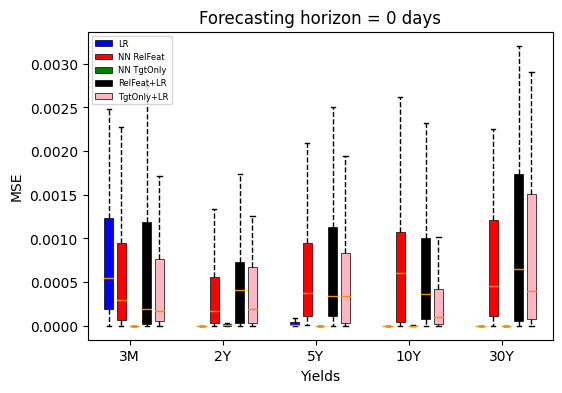

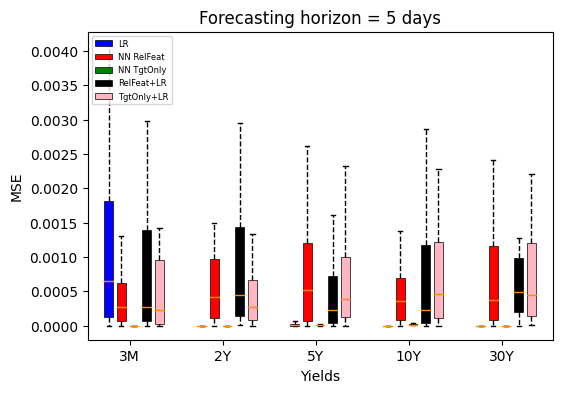

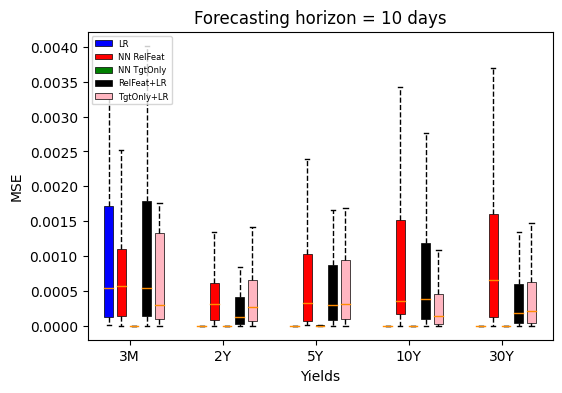

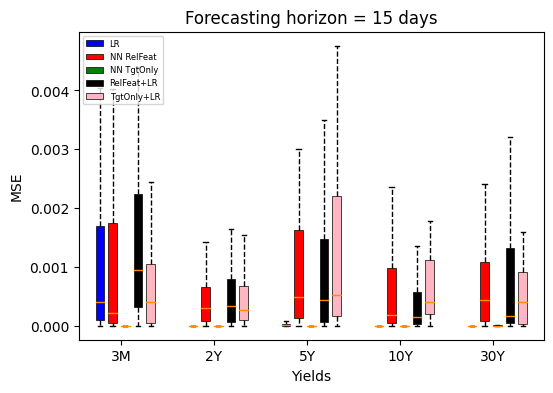

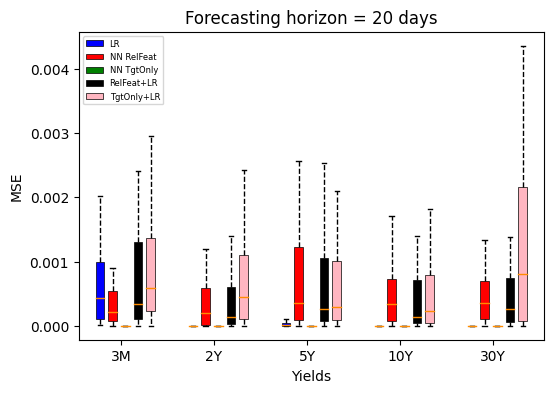

In [18]:
axis=['3M','2Y','5Y','10Y','30Y']
def plot_function1(i):
    
    '''

    Function generates the graphs

    Input: number of horizons 

    Output: returns the plot data as a nested list

    '''
    
    horizon=[1,6,11,16,21]
    titles="Forecasting horizon = " + str(horizon[i]-1) + " days"
    data = {}

    for j in range(0, 5):
        list1 = {}
        for k in range(0, 5):
            if k==0:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'LR':list_mse[i][j][k]})

            elif k==1:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'NN RelFeat':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'NN RelFeat':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'NN RelFeat':list_mse[i][j][k]})
            elif k==2:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'NN TgtOnly':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'NN TgtOnly':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'NN TgtOnly':list_mse[i][j][k]})
            elif k==3:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'RelFeat+LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'RelFeat+LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'RelFeat+LR':list_mse[i][j][k]})
            else:
                if isinstance(list_mse[i][j][k], pd.DataFrame):
                    list1.update({'TgtOnly+LR':list_mse[i][j][k].values.flatten()})
                elif isinstance(list_mse[i][j][k], np.ndarray):
                    list1.update({'TgtOnly+LR':list_mse[i][j][k].flatten()})
                else:
                    list1.update({'TgtOnly+LR':list_mse[i][j][k]})

        key = axis[j]
        data.update({key: list1})


    #Extract keys and values from the data dictionary
    outer_keys = list(data.keys())
    inner_keys = list(data[outer_keys[0]].keys())

    # Define colors for each inner key
    colors = {
        'LR': 'blue',
        'NN RelFeat': 'red',
        'NN TgtOnly': 'green',
        'RelFeat+LR': 'black',
        'TgtOnly+LR': 'lightpink'
    }

    # Create a box plot for each inner key on the same chart with grouping
    plt.figure(figsize=(6, 4))
    legend_labels = []
    group_width = 2.2  # Adjust the width between groups

    for i, inner_key in enumerate(inner_keys):
        positions = [j * group_width + i * 0.3 for j in range(len(outer_keys))]
        for j, outer_key in enumerate(outer_keys):
            values = [data[outer_key][inner_key]]

            box = plt.boxplot(values, positions=[positions[j]],
                              showfliers=False, patch_artist=True, widths=0.2)

            # Customize box colors
            for patch, color in zip(box['boxes'], [colors[inner_key]]):
                patch.set_facecolor(color)
                patch.set_linewidth(0.5)
            # Customize mean line color
            for line in box['medians']:
                line.set_color('darkorange')

            # Customize whiskers as dashed lines
            for whisker in box['whiskers']:
                whisker.set_linestyle('--')

        legend_labels.append((patch, inner_key))

    # Add legends
    plt.legend([label[0] for label in legend_labels], [label[1] for label in legend_labels], loc='upper left', prop={'size': 6})

    plt.title(titles)
    plt.xticks([j * group_width + 0.5 for j in range(len(outer_keys))], outer_keys)
    plt.xlabel('Yields')
    plt.ylabel('MSE')
    plt.show()    
    return data
# we call the plots in a loop
for i in range(len(horizons)):
    plot_function1(i)

<a id='4.2'></a>
#### 4.2. Normalized Vs non-normalized metrics

In [19]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.026320,0.022220,0.584065,0.310036
1,MSE,0.001186,0.001803,0.437254,0.397496
2,RMSE,0.034445,0.022220,0.661252,0.310036


<a id='4.3'></a>
#### 4.3. Forecasting results for 10Y



The scatter plot and the fit line helps us understand how well our model is making predictions. If there is less dispution then the predictions are good and vice versa. Here we see less dispurtions and hence conclude that the predictions are good

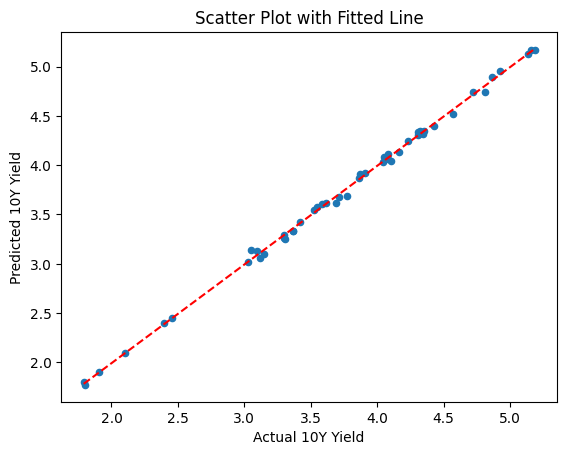

In [20]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}
df_fit_line = pd.DataFrame(data=d)

df_fit_line = df_fit_line.sort_values(by='Actual 10Y Yield')
df_fit_line.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# fit a line
fit = np.polyfit(df_fit_line['Actual 10Y Yield'], df_fit_line['Predicted 10Y Yield'], 1)

plt.plot(df_fit_line['Actual 10Y Yield'], np.polyval(fit, df_fit_line['Actual 10Y Yield']), 'r--')

plt.show()

<a id='4.4'></a>
#### 4.4. STL Vs  MTL: 0 days and 20 days

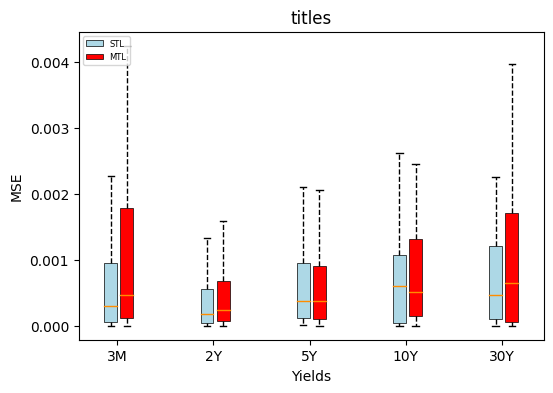

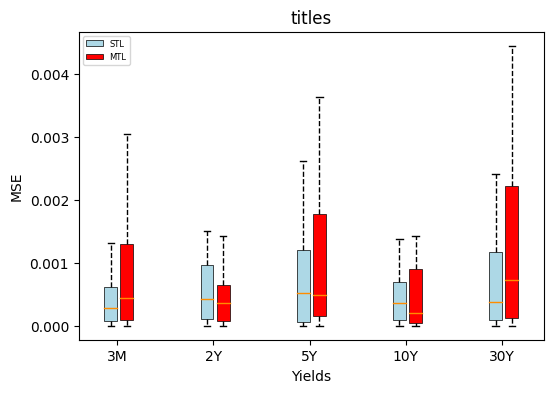

In [21]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''


    Function generates the graphs

    Input: number of horizons 

    Output: returns the plot data as a nested list


    '''
    
    
    data = {}
    for j in range(0, 5):
        list1 = {}

        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.update({'STL':list_mse[i][j][1].values.flatten()})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.update({'STL':list_mse[i][j][1].flatten()})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        else:
            list1.update({'STL':list_mse[i][j][1]})
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.update({'MTL':mse_values.values.flatten()})
            elif isinstance(mse_values, np.ndarray):
                list1.update({'MTL':mse_values.flatten()})
            else:
                list1.update({'MTL':mse_values})
        key = axis[j]
        data.update({key: list1})

    #Extract keys and values from the data dictionary
    outer_keys = list(data.keys())
    inner_keys = list(data[outer_keys[0]].keys())

    # Define colors for each inner key
    colors = {
        'STL': 'lightblue',
        'MTL': 'red'
    }

    # Create a box plot for each inner key on the same chart with grouping
    
    plt.figure(figsize=(6, 4))
    legend_labels = []
    group_width = 1.5  

    for i, inner_key in enumerate(inner_keys):
        positions = [j * group_width + i * 0.25 for j in range(len(outer_keys))]
        for j, outer_key in enumerate(outer_keys):
            values = [data[outer_key][inner_key]]

            box = plt.boxplot(values, positions=[positions[j]],
                              showfliers=False, patch_artist=True, widths=0.2)

           
            for patch, color in zip(box['boxes'], [colors[inner_key]]):
                patch.set_facecolor(color)
                patch.set_linewidth(0.5)
                
            
            for line in box['medians']:
                line.set_color('darkorange')

           
            for whisker in box['whiskers']:
                whisker.set_linestyle('--')

        legend_labels.append((patch, inner_key))

    # Add legends
    plt.legend([label[0] for label in legend_labels], [label[1] for label in legend_labels], loc='upper left', prop={'size': 6})

    plt.title('titles')
    plt.xticks([j * group_width + 0.1 for j in range(len(outer_keys))], outer_keys)
    plt.xlabel('Yields')
    plt.ylabel('MSE')
    plt.show()    
    return data
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)

Forecasting horizons of 0 days and 20 days for the above

We notice from the plot that models with 10 hidden units with appropriate feature selection provides low errors and good predictions

#### Conclusion

The idea in this project is to re-develop the models in the paper to understand the capabilities and pitfalls of neural networks. There is a need for more research to understand the reach of Multi-Task Learning models and how to improve them.

We infer that there is an exponential increase in model complexity if we incorporate the horizons. This complexity must be tackled for efficient and accurate predictions using the MTL models.

From a finance point of view, we may not know if these models can handle and provide extreme scenarios like the twisting and steepening of the curve and also negative interest rates. Hence, additional study is required by isolating those extreme scenarios and testing the model for them. 

Overall, the models replicated in this study can help financial practitioners expand on the features/parameters like FX, balance sheet, emerging markets and other information for the MTL to estimate the curve.